In [2]:
library(data.table)
library(ggplot2)
library(SingleCellExperiment)
library(tidyr)
library(viridis)
library(miloR)
library(patchwork)
library(scater)
library(dplyr)
library(scater)
library(scran)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

In [3]:
options(repr.plot.width=15, repr.plot.height=6)

In [4]:
clusters_in = '/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/data/genotyping'
samples = c('SITTA7',
           'SITTB7',
           'SITTC7',
           'SITTD7',
           'SITTE12',
           'SITTH10')
data_in = '/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/processed/'

In [4]:
sce = readRDS(file.path(data_in, 'SingleCellExperiment.rds'))

In [5]:
clusters = list()
for(i in samples){
    clusters[[i]] = fread(file.path(clusters_in, i, 'clusters.tsv')) %>%
                        .[,c('sample', 'cell'):=list(i, sprintf('SLX-21184_%s_H5NKNDMXY#%s', i, .$barcode))] %>%
                        .[,clust_diff:=abs(cluster1-cluster0)]
    
}
clusters = rbindlist(clusters)

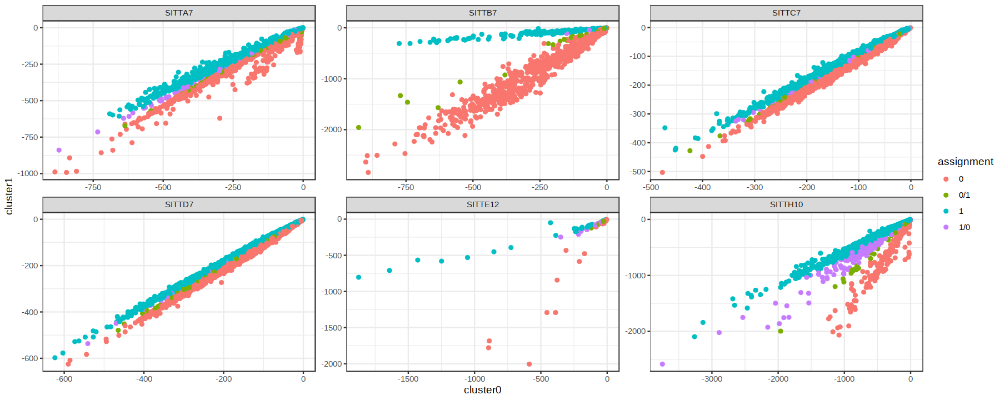

In [6]:
ggplot(clusters, aes(cluster0, cluster1, col=assignment)) + 
    geom_point() +
    facet_wrap(~sample, scales='free') + 
    theme_bw()

In [7]:
counts <- assay(sce, "counts")
libsizes <- colSums(counts)
size.factors <- libsizes/mean(libsizes)
logcounts(sce) <- log2(t(t(counts)/size.factors) + 1)

In [8]:
tomato = data.frame('tomato' = sce@assays@data$logcounts['tomato-td',]) %>% as.data.table(keep.rownames=TRUE) %>%
            setnames("rn", 'cell') %>% merge(clusters, by='cell')

Warning message:
“Groups with fewer than two data points have been dropped.”


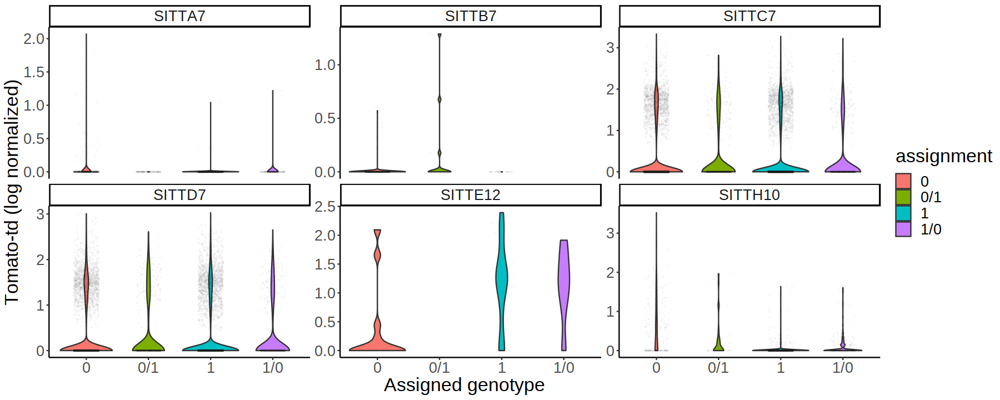

In [9]:
ggplot(tomato, aes(assignment, tomato, fill=assignment)) + 
    geom_violin() + 
    geom_point(size = 0.05, alpha = 0.02, position=position_jitter(width = 0.2, height = 0)) + 
    facet_wrap(~sample, scales='free_y') +
    ylab('Tomato-td (log normalized)') + 
    xlab('Assigned genotype') + 
    theme_classic() + theme(text = element_text(size=20))

In [10]:
clusters = list()
for(i in samples){
    clusters[[i]] = fread(sprintf('%s/%s_common_variants/clusters.tsv', clusters_in, i)) %>%
                        .[,c('sample', 'cell'):=list(i, sprintf('SLX-21184_%s_H5NKNDMXY#%s', i, .$barcode))] %>%
                        .[,clust_diff:=abs(cluster1-cluster0)]
    
}
clusters = rbindlist(clusters)

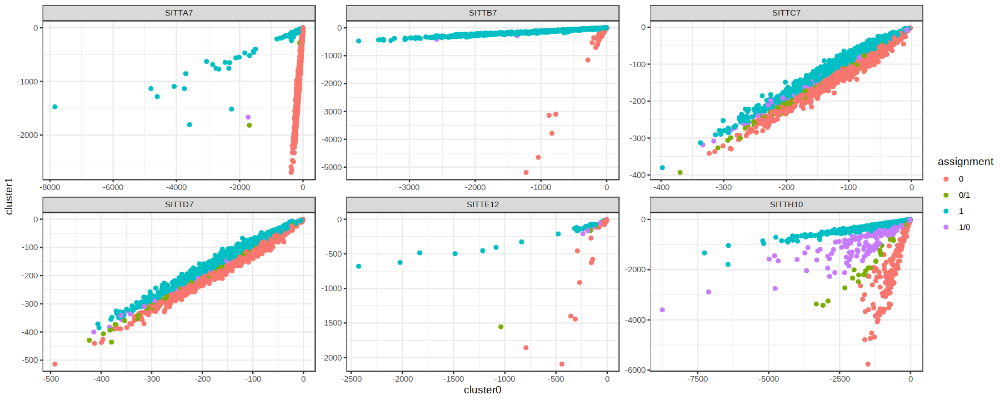

In [11]:
ggplot(clusters, aes(cluster0, cluster1, col=assignment)) + 
    geom_point() +
    facet_wrap(~sample, scales='free') + 
    theme_bw()

In [41]:
head(clusters)
table(clusters$sample, clusters$assignment)

barcode,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,sample,cell,clust_diff
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
AAACGAACAAAGGAGA-1,unassigned,1,-1.459569,-1.824979,-1.86781,-1.459569,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAAAGGAGA-1,0.4082415
AAACGAACAATTGCAC-1,singlet,0,-124.799770,-132.982082,-124.79977,-826.715375,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1,701.9156050
AAACGAACACCAGCTG-1,singlet,0,-203.379778,-219.147209,-203.37978,-1448.907886,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1,1245.5281077
AAAGAACAGACAGTCG-1,singlet,1,-548.672533,-1772.960352,-2016.35523,-548.672533,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAAGAACAGACAGTCG-1,1467.6827013
AAAGAACAGTCAGGGT-1,singlet,0,-31.323187,-35.932905,-31.32319,-186.925432,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAAGAACAGTCAGGGT-1,155.6022448
AAAGAACCAAATGATG-1,singlet,0,-108.669355,-120.750006,-108.66936,-962.991821,SITTA7,SLX-21184_SITTA7_H5NKNDMXY#AAAGAACCAAATGATG-1,854.3224657


         
             0  0/1    1  1/0
  SITTA7  2430   34  181    5
  SITTB7   182    5  948   14
  SITTC7  9221 1297 9550 1223
  SITTD7  8243  996 7853 1054
  SITTE12   41   12   30   21
  SITTH10  453  122 3513 1073

In [30]:
tomato = data.frame('tomato' = sce@assays@data$logcounts['tomato-td',]) %>% as.data.table(keep.rownames=TRUE) %>%
            setnames("rn", 'cell') %>% merge(clusters, by='cell')

Warning message:
“Groups with fewer than two data points have been dropped.”


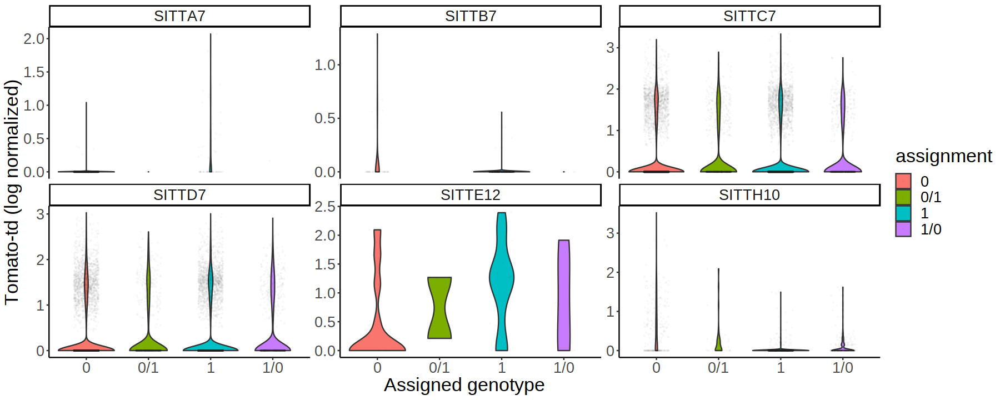

In [13]:
ggplot(tomato, aes(assignment, tomato, fill=assignment)) + 
    geom_violin() + 
    geom_point(size = 0.05, alpha = 0.02, position=position_jitter(width = 0.2, height = 0)) + 
    facet_wrap(~sample, scales='free_y') +
    ylab('Tomato-td (log normalized)') + 
    xlab('Assigned genotype') + 
    theme_classic() + theme(text = element_text(size=20))

In [14]:
table(tomato$sample, tomato$assignment)

         
             0  0/1    1  1/0
  SITTA7  2109    2   65    1
  SITTB7    51    0  769    4
  SITTC7  6905 1030 7121 1003
  SITTD7  7233  907 6853  964
  SITTE12   13    2   24    5
  SITTH10  238   35 1649  203

In [ ]:
tomato$assignment

In [15]:
y_genes = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt") %>% 
    .[chr=='chrY',] %>% .$symbol
y_genes = y_genes[y_genes %in% rownames(sce)]

In [25]:
y_count = data.frame(y_count = colSums(logcounts(sce[y_genes,]))) %>% as.data.table(keep.rownames=TRUE) %>%
            setnames("rn", 'cell')

In [31]:
tomato = merge(tomato, y_count, by='cell')

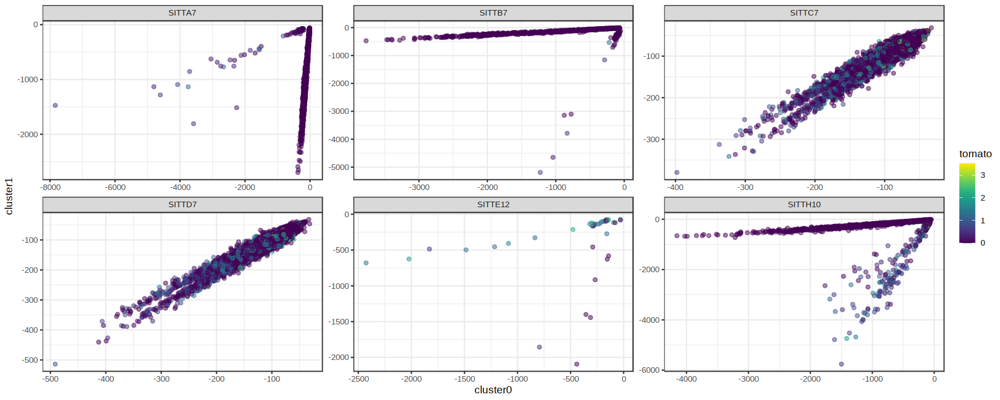

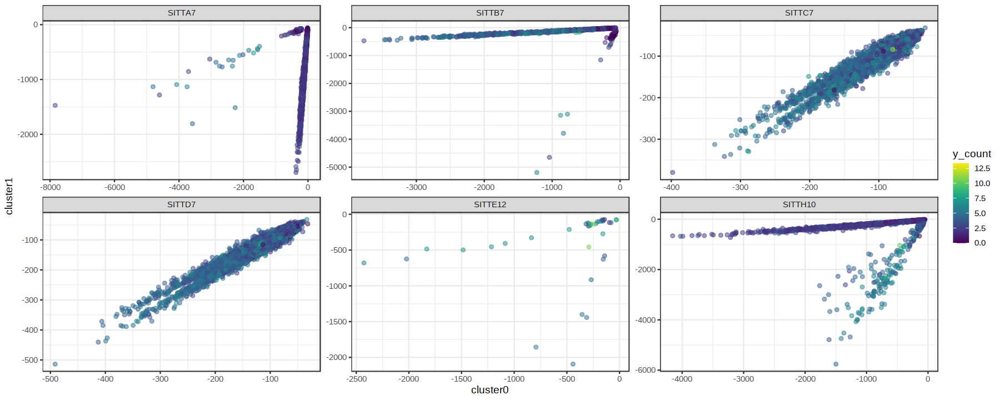

In [32]:
ggplot(tomato[assignment %in% c('0','1'),], aes(cluster0, cluster1, col=tomato)) + 
    geom_point(alpha = 0.5) +
    scale_color_viridis() + 
    facet_wrap(~sample, scales='free') + 
    theme_bw()

ggplot(tomato[assignment %in% c('0','1'),], aes(cluster0, cluster1, col=y_count)) + 
    geom_point(alpha = 0.5) +
    scale_color_viridis() + 
    facet_wrap(~sample, scales='free') + 
    theme_bw()

In [33]:
tomato$tdTom = ifelse(tomato$tomato>0, TRUE, FALSE)
summary(tomato$tdTom)

   Mode   FALSE    TRUE 
logical   30336    6850 

         
             0  0/1    1  1/0
  SITTA7  2430   34  181    5
  SITTB7   182    5  948   14
  SITTC7  9221 1297 9550 1223
  SITTD7  8243  996 7853 1054
  SITTE12   41   12   30   21
  SITTH10  453  122 3513 1073

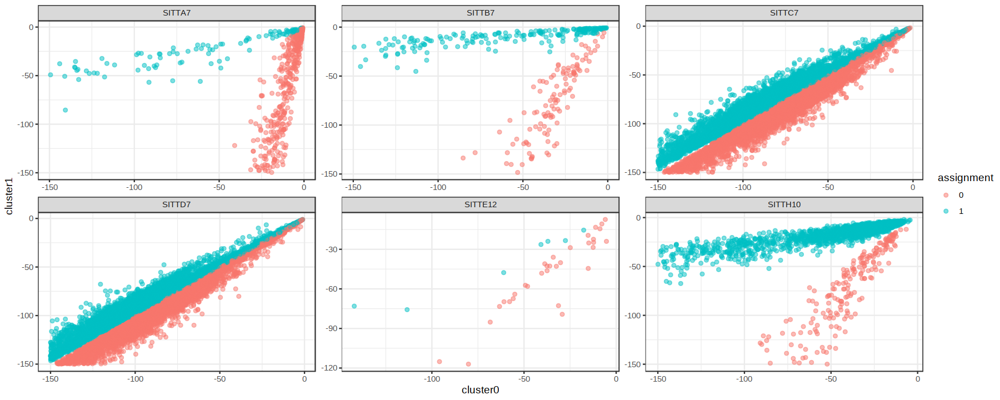

         
             0  0/1    1  1/0
  SITTA7  2029    2   77    1
  SITTB7    68    0  732    3
  SITTC7   532  121  506  108
  SITTD7  1062  155  926  179
  SITTE12    9    2   23    4
  SITTH10  251   27 1343  171

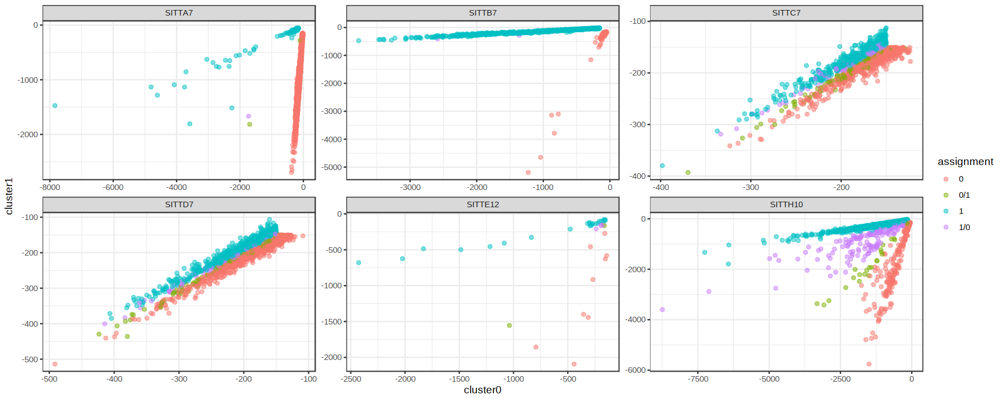

In [70]:
cutoff = 150
ggplot(clusters[cluster0>=-cutoff & cluster1>=-cutoff & assignment %in% c('0', '1'),], aes(cluster0, cluster1, col=assignment)) + 
    geom_point(alpha = 0.5) +
  #  scale_color_viridis() + 
    facet_wrap(~sample, scales='free') +
    theme_bw()
table(clusters$sample, clusters$assignment)
test = clusters[cluster0<=-cutoff | cluster1<=-cutoff,]
ggplot(test, aes(cluster0, cluster1, col=assignment)) + 
    geom_point(alpha = 0.5) +
  #  scale_color_viridis() + 
    facet_wrap(~sample, scales='free') + 
    theme_bw()

table(test$sample, test$assignment)

In [34]:
table(tomato$sample)


 SITTA7  SITTB7  SITTC7  SITTD7 SITTE12 SITTH10 
   2177     824   16059   15957      44    2125 

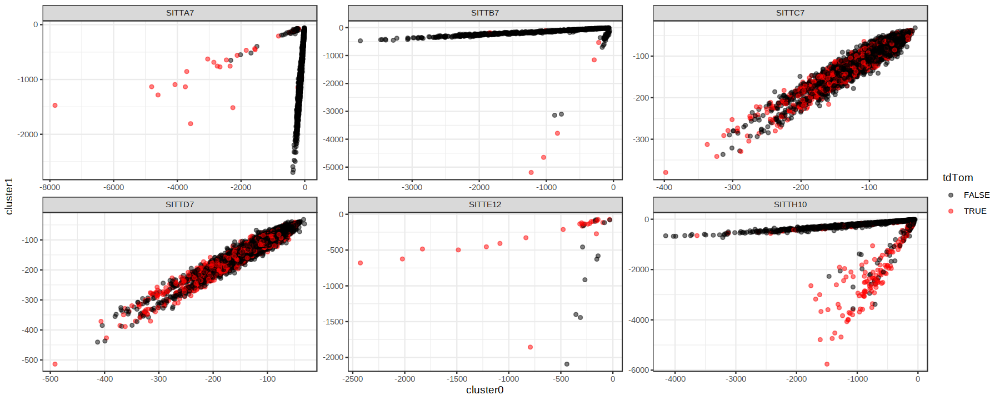

In [35]:
ggplot(tomato[assignment %in% c('0','1'),], aes(cluster0, cluster1, col=tdTom)) + 
    geom_point(alpha = 0.5) +
    scale_color_manual(values=c('black', 'red')) + 
    facet_wrap(~sample, scales='free') + 
    theme_bw()

In [36]:
table(tomato[sample == 'SITTH10',]$tdTom)


FALSE  TRUE 
 1859   266 

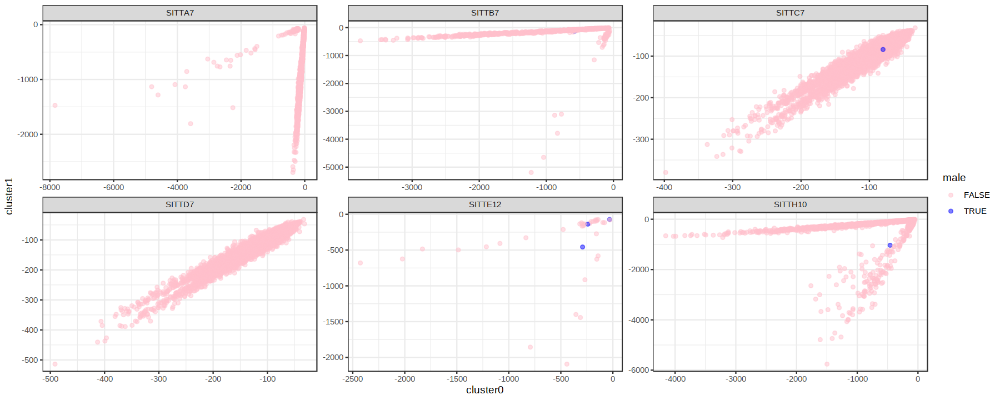

In [58]:
tomato$male = ifelse(tomato$y_count>8, TRUE, FALSE)
ggplot(tomato[assignment %in% c('0','1'),], aes(cluster0, cluster1, col=male)) + 
    geom_point(alpha = 0.5) +
    scale_color_manual(values=c('pink', 'blue')) + 
    facet_wrap(~sample, scales='free') + 
    theme_bw()

In [59]:
tomato$KO = ifelse(tomato$tdTom==TRUE | tomato$male==TRUE, TRUE, FALSE)

In [61]:
head(tomato, 2)

cell,tomato,barcode,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,sample,clust_diff,y_count,tdTom,male,KO
<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>
SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1,0,AAACGAACAATTGCAC-1,singlet,0,-124.7998,-132.9821,-124.7998,-826.7154,SITTA7,701.9156,1.533807,FALSE,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1,0,AAACGAACACCAGCTG-1,singlet,0,-203.3798,-219.1472,-203.3798,-1448.9079,SITTA7,1245.5281,2.354539,FALSE,FALSE,FALSE


In [62]:
table(tomato$KO, tomato$assignment, tomato$sample)

, ,  = SITTA7

       
           0  0/1    1  1/0
  FALSE 2104    2   41    0
  TRUE     5    0   24    1

, ,  = SITTB7

       
           0  0/1    1  1/0
  FALSE   46    0  764    4
  TRUE     5    0    5    0

, ,  = SITTC7

       
           0  0/1    1  1/0
  FALSE 5582  805 5782  789
  TRUE  1323  225 1339  214

, ,  = SITTD7

       
           0  0/1    1  1/0
  FALSE 5693  717 5386  733
  TRUE  1540  190 1467  231

, ,  = SITTE12

       
           0  0/1    1  1/0
  FALSE    8    0    5    2
  TRUE     5    2   19    3

, ,  = SITTH10

       
           0  0/1    1  1/0
  FALSE   94   18 1603  143
  TRUE   144   17   46   60


In [304]:
tomato$KO_corr = ifelse(tomato$tdTom==TRUE | 
                   tomato$sample %in% c('SITTC7', 'SITTD7') | 
                   tomato$sample == 'SITTH10' & tomato$assignment == 0, 
                   TRUE, FALSE)

In [305]:
umap = fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/dimensionality_reduction/sce/umap_features2500_pcs50_neigh25_dist0.5.txt.gz")

In [306]:
colnames(umap)

[1] "UMAP1" "UMAP2" "cell"

In [307]:
plot = merge(umap, tomato, by='cell')

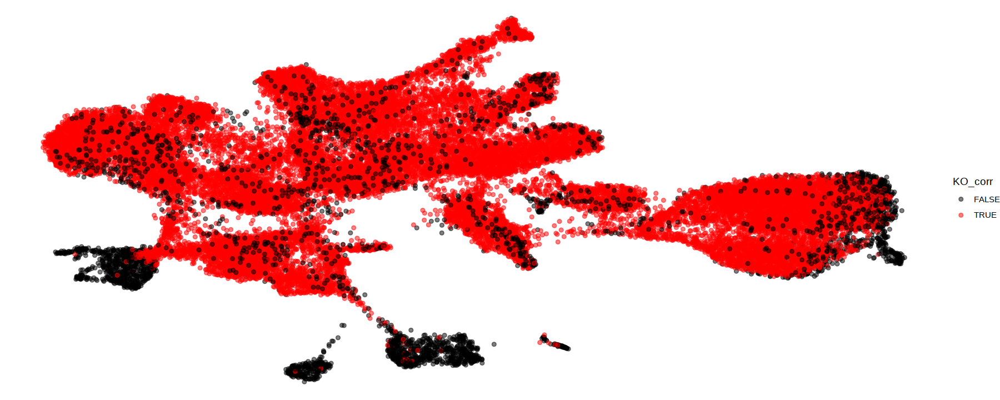

In [308]:
ggplot(plot, aes(UMAP1, UMAP2, col=KO_corr)) + 
    geom_point(alpha=0.5) + 
    scale_color_manual(values=c('black', 'red')) +
    theme_void()

In [309]:
meta = fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/mapping/sample_metadata_after_mapping.txt.gz")

In [310]:
meta = merge(meta, plot, by='cell')

In [311]:
meta = meta[pass_rnaQC==TRUE & doublet_call==FALSE]

In [312]:
meta = meta[cell %in% colnames(sce)]

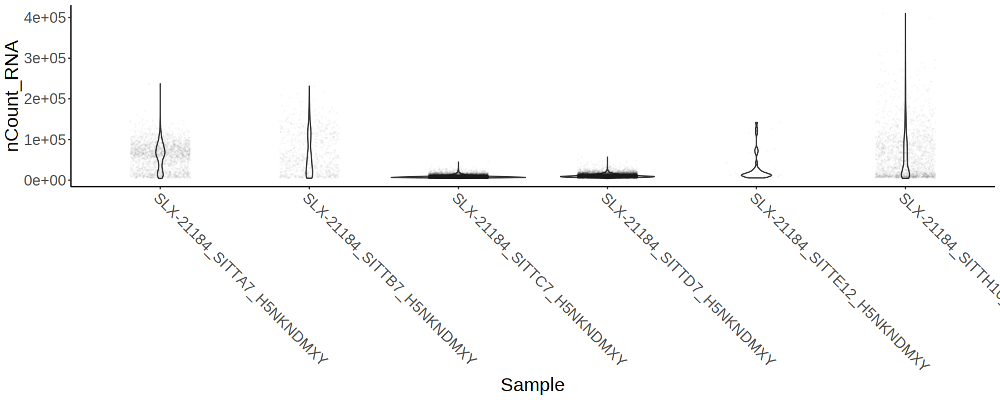

In [314]:
ggplot(meta, aes_string('sample.x', 'nCount_RNA')) + 
    geom_violin() + 
    geom_point(size = 0.05, alpha = 0.02, position=position_jitter(width = 0.2, height = 0)) + 
    #facet_wrap(~sample.x, scales='free_y') +
    ylab('nCount_RNA') + 
    xlab('Sample') + 
    theme_classic() + theme(text = element_text(size=20), axis.text.x=element_text(angle=-45, hjust=0))

In [315]:
head(meta)

cell,barcode.x,sample.x,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,stage,pass_rnaQC,doublet_score,⋯,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,sample.y,clust_diff,y_count,tdTom,KO_corr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>
SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1,AAACGAACAATTGCAC-1,SLX-21184_SITTA7_H5NKNDMXY,5488,57471,2.47,28.42,SLX-21184,TRUE,0.26,⋯,0,-124.79977,-132.98208,-124.79977,-826.7154,SITTA7,701.91561,6,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1,AAACGAACACCAGCTG-1,SLX-21184_SITTA7_H5NKNDMXY,6686,110322,1.80,30.12,SLX-21184,TRUE,0.33,⋯,0,-203.37978,-219.14721,-203.37978,-1448.9079,SITTA7,1245.52811,25,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAAGAACAGACAGTCG-1,AAAGAACAGACAGTCG-1,SLX-21184_SITTA7_H5NKNDMXY,6496,52477,1.78,21.48,SLX-21184,TRUE,0.22,⋯,1,-548.67253,-1772.96035,-2016.35523,-548.6725,SITTA7,1467.68270,14,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAAGAACCAAATGATG-1,AAAGAACCAAATGATG-1,SLX-21184_SITTA7_H5NKNDMXY,5560,64657,2.83,30.18,SLX-21184,TRUE,0.27,⋯,0,-108.66936,-120.75001,-108.66936,-962.9918,SITTA7,854.32247,4,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAAGAACCACTTTATC-1,AAAGAACCACTTTATC-1,SLX-21184_SITTA7_H5NKNDMXY,2986,8690,0.12,17.25,SLX-21184,TRUE,0.02,⋯,0,-20.88842,-22.02508,-20.88842,-116.1727,SITTA7,95.28429,1,FALSE,FALSE
SLX-21184_SITTA7_H5NKNDMXY#AAAGAACGTATGGGAC-1,AAAGAACGTATGGGAC-1,SLX-21184_SITTA7_H5NKNDMXY,6594,100108,2.76,29.42,SLX-21184,TRUE,0.69,⋯,0,-199.31699,-215.31568,-199.31699,-1504.4788,SITTA7,1305.16179,21,FALSE,FALSE


In [316]:
sce = sce[,meta$cell]


In [317]:
meta = meta[order(colnames(sce))]

In [318]:
class(meta)

[1] "data.table" "data.frame"

In [319]:
colData(sce) = meta %>% tibble::column_to_rownames("cell") %>% DataFrame

In [320]:
pca = as.data.frame(fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/dimensionality_reduction/sce/pca_features2500_pcs50_batchcorrectionbysample.txt.gz"))

In [321]:
pca = pca[pca$cell %in% colnames(sce),]
rownames(pca) = pca[,1]
pca = pca[,-1]

In [322]:
umap = colData(sce)[,c('UMAP1', 'UMAP2')] %>% as.data.frame()
rownames(umap) = colnames(sce)
colnames(umap) = c('UMAP1', 'UMAP2')

In [323]:
reducedDims(sce) <- list(pca.corrected=pca, 
                         umap = umap)

reducedDim(sce, "pca.corrected") = as.matrix(reducedDim(sce, "pca.corrected"))

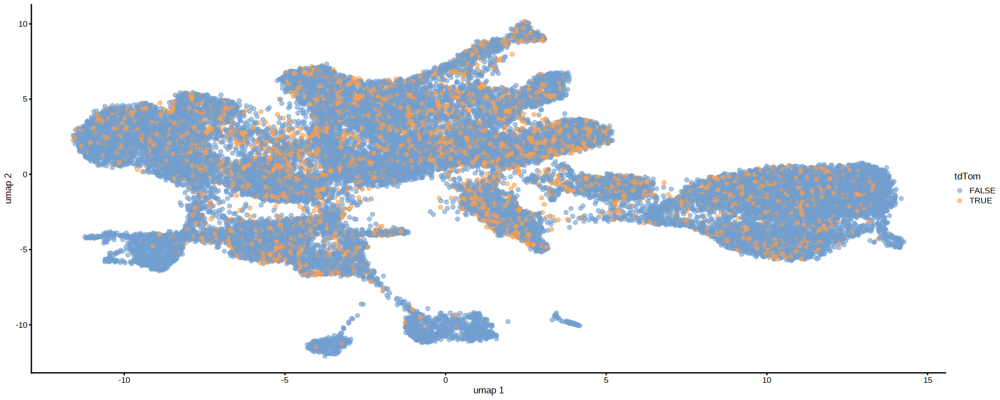

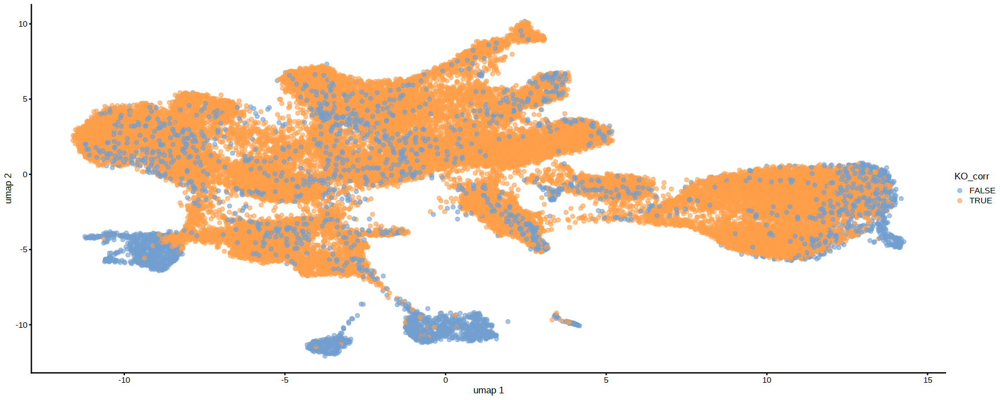

In [325]:
plotReducedDim(sce, colour_by="tdTom", dimred = "umap") 
plotReducedDim(sce, colour_by="KO_corr", dimred = "umap") 

In [326]:
embryo_milo <- Milo(sce)
embryo_milo

class: Milo 
dim: 29453 34892 
metadata(0):
assays(2): counts logcounts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(28): barcode.x sample.x ... tdTom KO_corr
reducedDimNames(2): pca.corrected umap
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1

In [327]:
colData(embryo_milo)$sample_ko = paste0(colData(embryo_milo)$sample.x, '_',  colData(embryo_milo)$KO_corr)

In [328]:
embryo_milo <- buildGraph(embryo_milo, k = 30, d = 30, reduced.dim = "pca.corrected")

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Constructing kNN graph with k:30



In [329]:
# lower prop for larger datasets
embryo_milo <- makeNhoods(embryo_milo, prop = 0.1, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

Checking valid object

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”


In [334]:
colnames(colData(embryo_milo))

[1] "barcode.x"                 "sample.x"                 
 [3] "nFeature_RNA"              "nCount_RNA"               
 [5] "mitochondrial_percent_RNA" "ribosomal_percent_RNA"    
 [7] "stage"                     "pass_rnaQC"               
 [9] "doublet_score"             "doublet_call"             
[11] "celltype.mapped_mnn"       "celltype.score_mnn"       
[13] "closest.cell_mnn"          "UMAP1"                    
[15] "UMAP2"                     "tomato"                   
[17] "barcode.y"                 "status"                   
[19] "assignment"                "log_prob_singleton"       
[21] "log_prob_doublet"          "cluster0"                 
[23] "cluster1"                  "sample.y"                 
[25] "clust_diff"                "y_count"                  
[27] "tdTom"                     "KO_corr"                  
[29] "sample_ko"

In [331]:
embryo_milo <- countCells(embryo_milo, meta.data = as.data.frame(colData(embryo_milo)), sample="sample_ko")

Checking meta.data validity

Counting cells in neighbourhoods



In [332]:
head(nhoodCounts(embryo_milo))

   [[ suppressing 10 column names ‘SLX-21184_SITTA7_H5NKNDMXY_FALSE’, ‘SLX-21184_SITTA7_H5NKNDMXY_TRUE’, ‘SLX-21184_SITTB7_H5NKNDMXY_FALSE’ ... ]]



6 x 10 sparse Matrix of class "dgCMatrix"
                       
1 . . . . 20 28 1 . . .
2 . . . . 21 42 . . 2 .
3 . . . . 21 60 . . . .
4 . . 1 . 39 82 . . 1 1
5 . . . . 39 18 . . 6 1
6 . . . . 22 64 . . 1 .

In [335]:
embryo_design <- data.frame(colData(embryo_milo))[,c("sample_ko", "sample.x", 'KO_corr')]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

embryo_design

,sample_ko,sample.x,KO_corr
,<chr>,<chr>,<lgl>
SLX-21184_SITTA7_H5NKNDMXY_FALSE,SLX-21184_SITTA7_H5NKNDMXY_FALSE,SLX-21184_SITTA7_H5NKNDMXY,FALSE
SLX-21184_SITTA7_H5NKNDMXY_TRUE,SLX-21184_SITTA7_H5NKNDMXY_TRUE,SLX-21184_SITTA7_H5NKNDMXY,TRUE
SLX-21184_SITTB7_H5NKNDMXY_FALSE,SLX-21184_SITTB7_H5NKNDMXY_FALSE,SLX-21184_SITTB7_H5NKNDMXY,FALSE
SLX-21184_SITTB7_H5NKNDMXY_TRUE,SLX-21184_SITTB7_H5NKNDMXY_TRUE,SLX-21184_SITTB7_H5NKNDMXY,TRUE
SLX-21184_SITTC7_H5NKNDMXY_TRUE,SLX-21184_SITTC7_H5NKNDMXY_TRUE,SLX-21184_SITTC7_H5NKNDMXY,TRUE
SLX-21184_SITTD7_H5NKNDMXY_TRUE,SLX-21184_SITTD7_H5NKNDMXY_TRUE,SLX-21184_SITTD7_H5NKNDMXY,TRUE
SLX-21184_SITTE12_H5NKNDMXY_TRUE,SLX-21184_SITTE12_H5NKNDMXY_TRUE,SLX-21184_SITTE12_H5NKNDMXY,TRUE
SLX-21184_SITTE12_H5NKNDMXY_FALSE,SLX-21184_SITTE12_H5NKNDMXY_FALSE,SLX-21184_SITTE12_H5NKNDMXY,FALSE
SLX-21184_SITTH10_H5NKNDMXY_FALSE,SLX-21184_SITTH10_H5NKNDMXY_FALSE,SLX-21184_SITTH10_H5NKNDMXY,FALSE


In [336]:
embryo_milo <- calcNhoodDistance(embryo_milo, d=30, reduced.dim = "pca.corrected")

In [337]:
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(embryo_milo, design = ~ KO_corr, design.df = embryo_design, reduced.dim="pca.corrected")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,5.1220242,9.830847,5.7831362,0.01618942,0.09340048,1,0.09220823
2,0.9348339,10.099242,0.4526352,0.50109373,0.79510522,2,0.77697442
3,5.4386779,10.009056,6.1841661,0.01289771,0.09340048,3,0.09220823
4,1.9272537,10.579775,1.3755974,0.24086606,0.54079265,4,0.52422865
5,-0.5889197,10.602403,0.1571336,0.69181346,0.89946238,5,0.88880633
6,2.2255408,10.171124,1.9505576,0.16254184,0.47582777,6,0.45165205


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
23,-8.382495,12.07032,12.50427,0.0004069144,0.0250459,23,0.02597751
33,-8.814772,12.45512,13.13143,0.0002910816,0.0250459,33,0.02597751
49,-8.493931,12.17750,12.66751,0.0003729017,0.0250459,49,0.02597751
83,-8.360449,12.06261,12.47525,0.0004132825,0.0250459,83,0.02597751
120,-8.702150,12.35836,12.97030,0.0003172157,0.0250459,120,0.02597751
251,-7.738084,11.52904,12.29568,0.0004549756,0.0250459,251,0.02597751


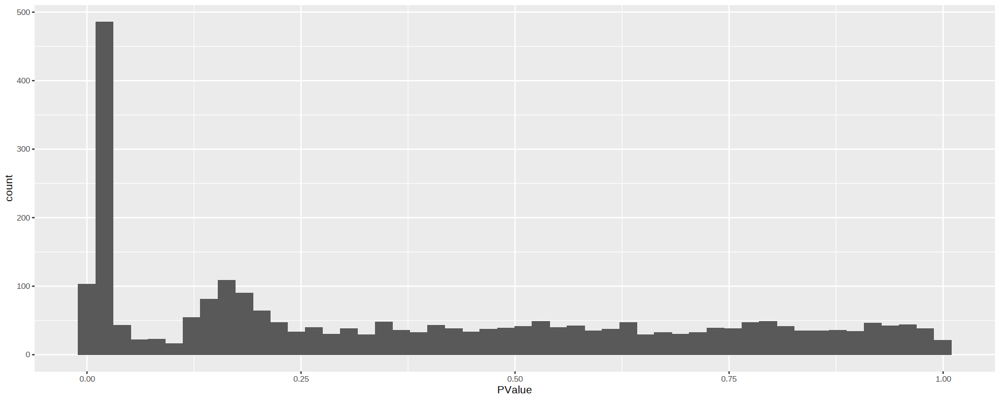

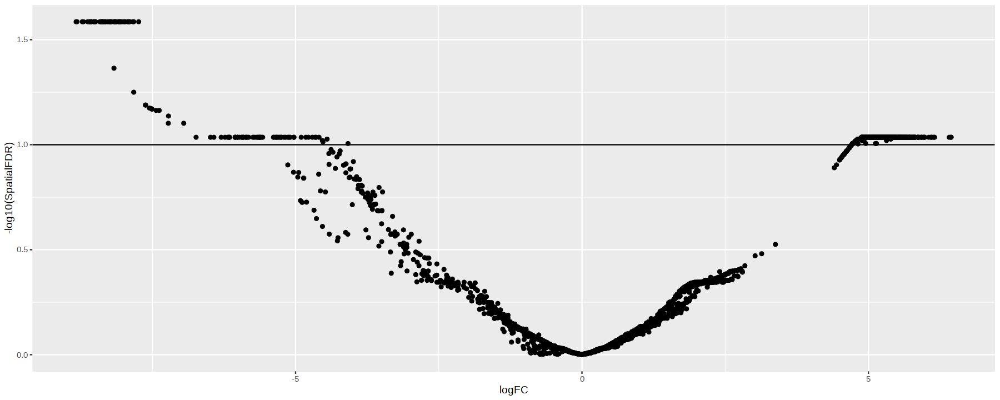

In [338]:
da_results %>%
  arrange(SpatialFDR) %>%
  head() 

ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)

ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) ## Mark significance threshold (10% FDR)

Warning message in plotNhoodGraph(x, colour_by = res_column, ...):
“Coercing layout to matrix format”
Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


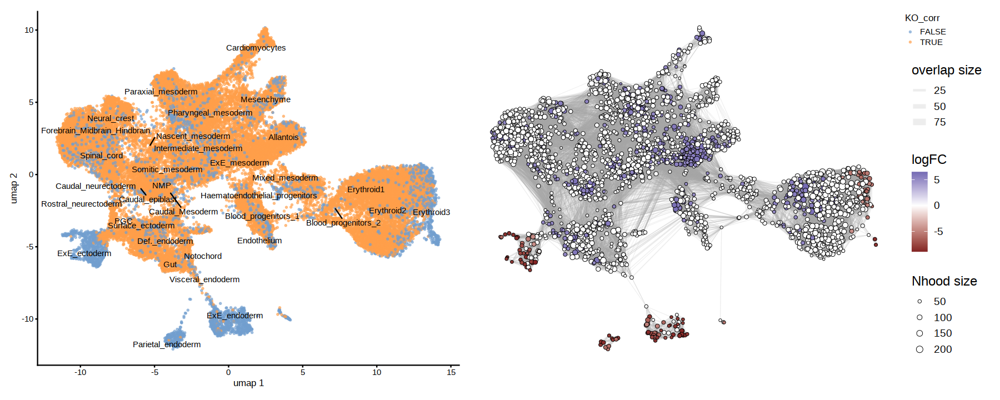

In [340]:
embryo_milo <- buildNhoodGraph(embryo_milo)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(embryo_milo, dimred = "umap", colour_by="KO_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="umap",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [341]:
da_results <- annotateNhoods(embryo_milo, da_results, coldata_col = "celltype.mapped_mnn")
head(da_results)

Converting celltype.mapped_mnn to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,celltype.mapped_mnn,celltype.mapped_mnn_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,5.1220242,9.830847,5.7831362,0.01618942,0.09340048,1,0.09220823,Mesenchyme,0.6326531
2,0.9348339,10.099242,0.4526352,0.50109373,0.79510522,2,0.77697442,Spinal_cord,0.5692308
3,5.4386779,10.009056,6.1841661,0.01289771,0.09340048,3,0.09220823,Erythroid1,0.7283951
4,1.9272537,10.579775,1.3755974,0.24086606,0.54079265,4,0.52422865,Surface_ectoderm,0.9596774
5,-0.5889197,10.602403,0.1571336,0.69181346,0.89946238,5,0.88880633,Haematoendothelial_progenitors,0.9062500
6,2.2255408,10.171124,1.9505576,0.16254184,0.47582777,6,0.45165205,Surface_ectoderm,1.0000000


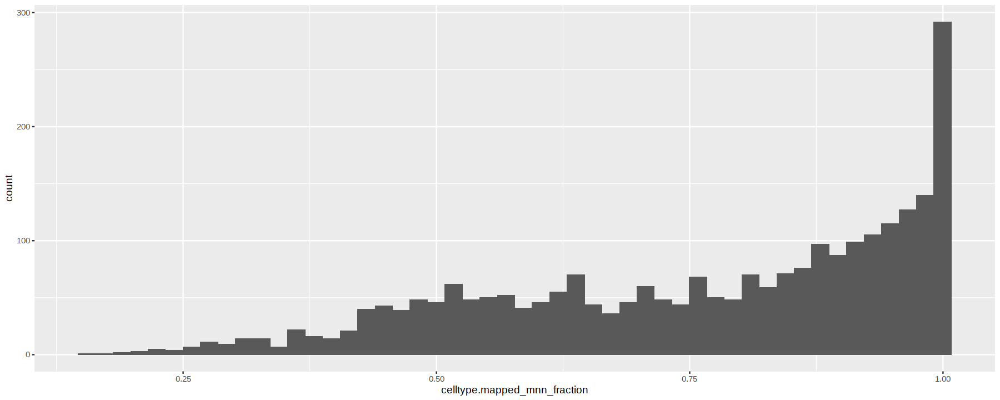

In [342]:
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + geom_histogram(bins=50)

In [343]:
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)


Converting group.by to factor...



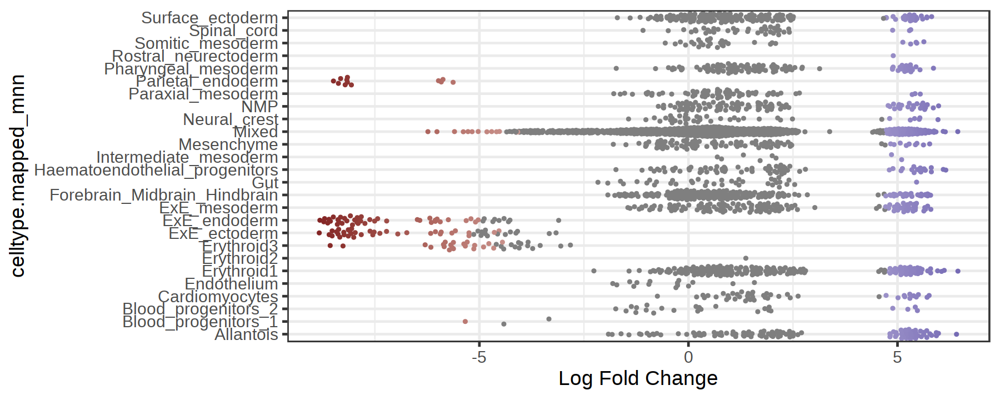

In [344]:
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")


# Comparing to WT-injection experiment

In [5]:
library(scater)
library(scran)
library(batchelor)

### WT

In [339]:
wt_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/WT_injection'
wt_counts = readRDS(file.path(wt_in, 'raw_counts.rds'))
wt_genes = fread(file.path(wt_in, 'genes.tsv'), header=FALSE)
wt_meta = fread(file.path(wt_in, 'meta.tab'))
biomart = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt")

In [340]:
wt_meta$cell = paste0('WT_', wt_meta$cell)
wt_meta = wt_meta[,c('cell', 'barcode', 'sample', 'stage', 'tomato')]
colnames(wt_meta) = c('cell', 'barcode', 'sample', 'stage', 'tdTom')
wt_meta$celltype.mapped_mnn = 'NA'
wt_meta$genotype = 'WT'

In [341]:
wt_genes$idx = 1:nrow(wt_genes)
wt_genes = merge(wt_genes, biomart, by.x='V1', by.y='ens_id', all.x=TRUE) %>% .[order(idx)]
wt_genes[is.na(symbol)]$symbol = wt_genes[is.na(symbol)]$V1

In [342]:
colnames(wt_counts) = wt_meta$cell
rownames(wt_counts) = wt_genes$symbol

In [343]:
wt_meta = wt_meta[stage == 'E8.5' & tdTom == TRUE] %>%
    data.frame() %>% tibble::column_to_rownames('cell') %>% .[,c('barcode', 'sample', 'celltype.mapped_mnn','genotype')]

In [344]:
wt_counts = wt_counts[,rownames(wt_meta)]

In [345]:
wt_sce = SingleCellExperiment(list(counts = wt_counts), colData = wt_meta)

### Runx1

In [346]:
runx_sce = readRDS(file.path(data_in, 'SingleCellExperiment.rds'))

In [347]:
runx_meta = fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/mapping/sample_metadata_after_mapping.txt.gz")

In [348]:
runx_meta = runx_meta %>% .[,idx:=1:nrow(.)] %>% 
    .[pass_rnaQC==TRUE & doublet_call==FALSE] %>% data.frame() 

In [349]:
clusters = list()
for(i in samples){
    clusters[[i]] = fread(sprintf('%s/%s_common_variants/clusters.tsv', clusters_in, i)) %>%
                        .[,c('sample', 'cell'):=list(i, sprintf('SLX-21184_%s_H5NKNDMXY#%s', i, .$barcode))] %>%
                        .[,clust_diff:=abs(cluster1-cluster0)]
    
}
clusters = rbindlist(clusters) %>% .[, c('cell', 'assignment')]

In [350]:
runx_meta = merge(runx_meta, clusters, by='cell')%>%
    tibble::column_to_rownames('cell') 

In [351]:
runx_sce = runx_sce[,rownames(runx_meta)]

In [352]:
runx_meta = runx_meta[order(colnames(runx_sce)),]

In [353]:
runx_sce

class: SingleCellExperiment 
dim: 29453 34892 
metadata(0):
assays(1): counts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(9): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [354]:
colData(runx_sce) = runx_meta %>% DataFrame

In [355]:
colData(runx_sce)$tomato = ifelse(runx_sce@assays@data$counts['tomato-td',]>0, TRUE, FALSE)

In [356]:
unique(colData(runx_sce)$sample)

[1] "SLX-21184_SITTA7_H5NKNDMXY"  "SLX-21184_SITTB7_H5NKNDMXY" 
[3] "SLX-21184_SITTC7_H5NKNDMXY"  "SLX-21184_SITTD7_H5NKNDMXY" 
[5] "SLX-21184_SITTE12_H5NKNDMXY" "SLX-21184_SITTH10_H5NKNDMXY"

In [357]:
colData(runx_sce)$genotype = ifelse(colData(runx_sce)$tomato==TRUE | 
                   colData(runx_sce)$sample %in% c('SLX-21184_SITTC7_H5NKNDMXY', 'SLX-21184_SITTD7_H5NKNDMXY') | 
                   colData(runx_sce)$sample == 'SITTH10' & colData(runx_sce)$assignment == 0, 
                   'Runx1_KO', 'Runx1_WT')

In [358]:
colData(runx_sce) = colData(runx_sce)[,c('barcode', 'sample', 'celltype.mapped_mnn','genotype')]

In [359]:
runx_sce = runx_sce[,colData(runx_sce)$genotype=='Runx1_KO']

### Merge

In [360]:
genes_keep = intersect(rownames(runx_sce), rownames(wt_sce))

In [361]:
sce = cbind(runx_sce[genes_keep, ], wt_sce[genes_keep, ])

In [362]:
args = list()
args$features <- 3000
args$npcs <- 30
args$batch_correction = 'genotype'
args$n_neighbors = 30
args$min_dist = 0.3

In [363]:
counts <- assay(sce, "counts")
libsizes <- colSums(counts)
size.factors <- libsizes/mean(libsizes)
logcounts(sce) <- log2(t(t(counts)/size.factors) + 1)

In [364]:
decomp <- modelGeneVar(sce)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

In [365]:
library(batchelor)

In [366]:
pca <- multiBatchPCA(sce_filt, batch = colData(sce_filt)[[args$batch_correction]], d = args$npcs)
pca.corrected <- reducedMNN(pca)$corrected
colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))
reducedDim(sce_filt, "pca.corrected") <- pca.corrected

In [367]:
sce_filt <- runUMAP(sce_filt, dimred="pca.corrected", n_neighbors = args$n_neighbors, min_dist = args$min_dist)

Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


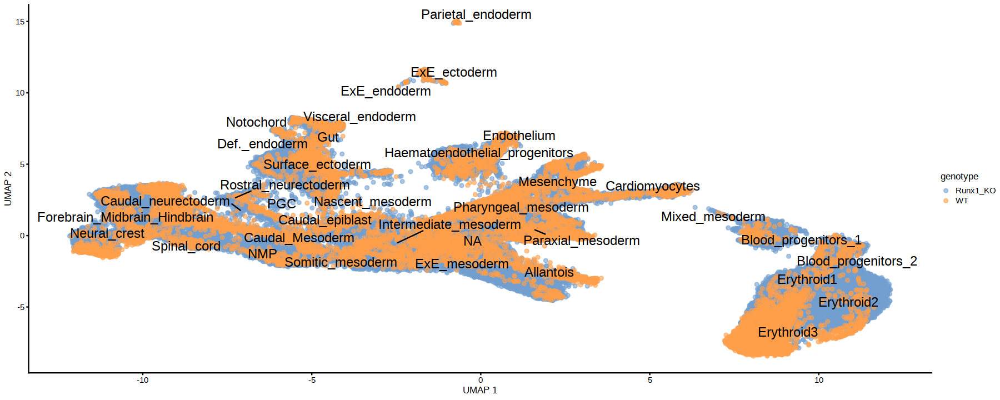

In [368]:
plotReducedDim(sce_filt, colour_by="genotype", dimred = "UMAP",  text_by = "celltype.mapped_mnn", 
                          text_size = 5) 


In [369]:
embryo_milo <- Milo(sce_filt)
embryo_milo

class: Milo 
dim: 3000 42578 
metadata(0):
assays(2): counts logcounts
rownames(3000): Hbb-bh1 Hba-x ... Palm2 Akap2
rowData names(0):
colnames(42578): SLX-21184_SITTA7_H5NKNDMXY#ACATGCAGTAAGGCTG-1
  SLX-21184_SITTA7_H5NKNDMXY#ACCACAAGTAGGAGGG-1 ... WT_cell_23600
  WT_cell_23601
colData names(4): barcode sample celltype.mapped_mnn genotype
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1

In [370]:
colData(embryo_milo)$sample_ko = paste0(colData(embryo_milo)$sample, '_',  colData(embryo_milo)$genotype)

In [371]:
embryo_milo <- buildGraph(embryo_milo, k = 30, d = 30, reduced.dim = "pca.corrected")

Constructing kNN graph with k:30



In [372]:
# lower prop for larger datasets
embryo_milo <- makeNhoods(embryo_milo, prop = 0.01, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

Checking valid object



In [373]:
colnames(colData(embryo_milo))

[1] "barcode"             "sample"              "celltype.mapped_mnn"
[4] "genotype"            "sample_ko"

In [374]:
embryo_milo <- countCells(embryo_milo, meta.data = as.data.frame(colData(embryo_milo)), sample="sample_ko")

Checking meta.data validity

Counting cells in neighbourhoods



In [375]:
head(nhoodCounts(embryo_milo))

6 x 9 sparse Matrix of class "dgCMatrix"
  SLX-21184_SITTA7_H5NKNDMXY_Runx1_KO SLX-21184_SITTB7_H5NKNDMXY_Runx1_KO
1                                   .                                   .
2                                   .                                   .
3                                   .                                   .
4                                   .                                   .
5                                   .                                   .
6                                   .                                   .
  SLX-21184_SITTC7_H5NKNDMXY_Runx1_KO SLX-21184_SITTD7_H5NKNDMXY_Runx1_KO
1                                  10                                  26
2                                  12                                  33
3                                   8                                  51
4                                  26                                   1
5                                   2                                  

In [376]:
embryo_design <- data.frame(colData(embryo_milo))[,c("sample_ko", "sample", 'genotype')]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

embryo_design

,sample_ko,sample,genotype
,<chr>,<chr>,<chr>
SLX-21184_SITTA7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTA7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTA7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTB7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTB7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTB7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTC7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTC7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTC7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTD7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTD7_H5NKNDMXY_Runx1_KO,SLX-21184_SITTD7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTE12_H5NKNDMXY_Runx1_KO,SLX-21184_SITTE12_H5NKNDMXY_Runx1_KO,SLX-21184_SITTE12_H5NKNDMXY,Runx1_KO
SLX-21184_SITTH10_H5NKNDMXY_Runx1_KO,SLX-21184_SITTH10_H5NKNDMXY_Runx1_KO,SLX-21184_SITTH10_H5NKNDMXY,Runx1_KO
1_WT,1_WT,1,WT
7_WT,7_WT,7,WT
9_WT,9_WT,9,WT


In [377]:
embryo_milo <- calcNhoodDistance(embryo_milo, d=30, reduced.dim = "pca.corrected")

In [378]:
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(embryo_milo, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.4724537,12.48478,0.132435442,0.715946746,0.92333712,1,0.90729155
2,-2.8004103,12.70830,3.246042587,0.071700271,0.54373868,2,0.46265928
3,-5.9219023,12.65279,10.375825252,0.001290923,0.07646955,3,0.06573745
4,-0.4651520,12.16166,0.135722529,0.712597955,0.92333712,4,0.90729155
5,0.1199421,13.49746,0.004069996,0.949136657,0.98681625,5,0.98507275
6,-0.6201911,12.21318,0.230252327,0.631373095,0.92333712,6,0.90354511


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3,-5.921902,12.65279,10.375825,0.001290923,0.07646955,3,0.06573745
14,-5.818794,12.55295,10.431195,0.001252926,0.07646955,14,0.06573745
71,-5.915265,12.63431,10.449971,0.001240300,0.07646955,71,0.06573745
90,-5.627634,12.41748,9.804961,0.001757807,0.07646955,90,0.06573745
132,-5.739414,12.49599,10.188486,0.001428360,0.07646955,132,0.06573745
145,7.658509,13.57241,9.721146,0.001839514,0.07646955,145,0.06573745


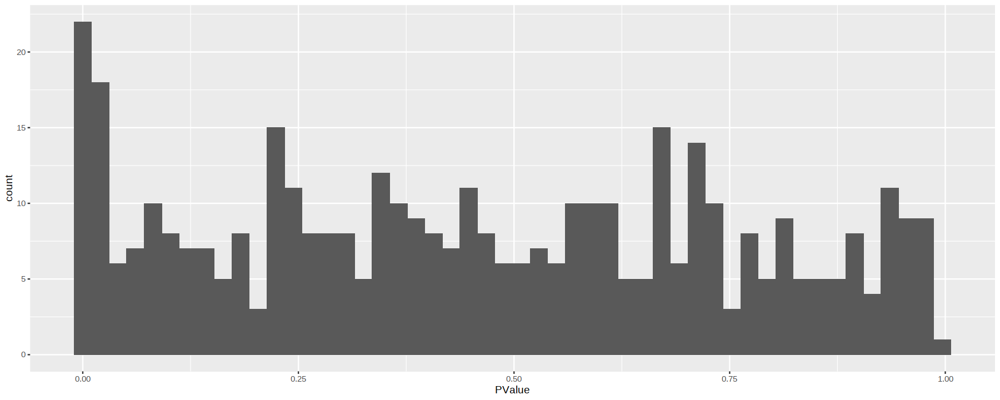

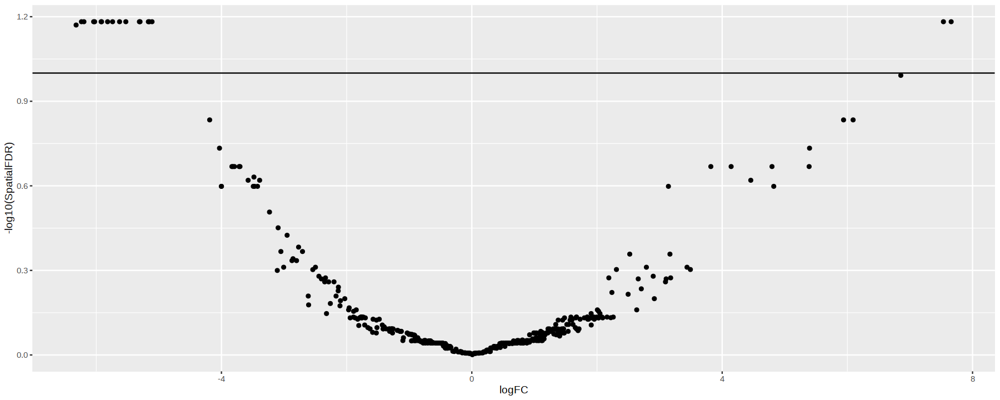

In [379]:
da_results %>%
  arrange(SpatialFDR) %>%
  head() 

ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)

ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) ## Mark significance threshold (10% FDR)

In [380]:
da_results$logFC = da_results$logFC * -1

Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


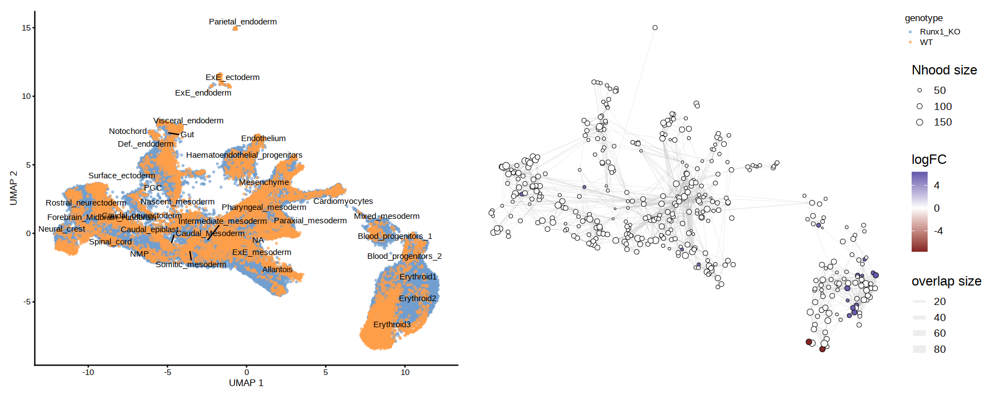

In [381]:
embryo_milo <- buildNhoodGraph(embryo_milo)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(embryo_milo, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [382]:
da_results <- annotateNhoods(embryo_milo, da_results, coldata_col = "celltype.mapped_mnn")
head(da_results)

Converting celltype.mapped_mnn to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,celltype.mapped_mnn,celltype.mapped_mnn_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,0.4724537,12.48478,0.132435442,0.715946746,0.92333712,1,0.90729155,Surface_ectoderm,0.8571429
2,2.8004103,12.70830,3.246042587,0.071700271,0.54373868,2,0.46265928,Surface_ectoderm,0.9591837
3,5.9219023,12.65279,10.375825252,0.001290923,0.07646955,3,0.06573745,Erythroid1,0.9833333
4,0.4651520,12.16166,0.135722529,0.712597955,0.92333712,4,0.90729155,Blood_progenitors_2,0.6000000
5,-0.1199421,13.49746,0.004069996,0.949136657,0.98681625,5,0.98507275,Allantois,0.6909091
6,0.6201911,12.21318,0.230252327,0.631373095,0.92333712,6,0.90354511,Erythroid2,0.5135135


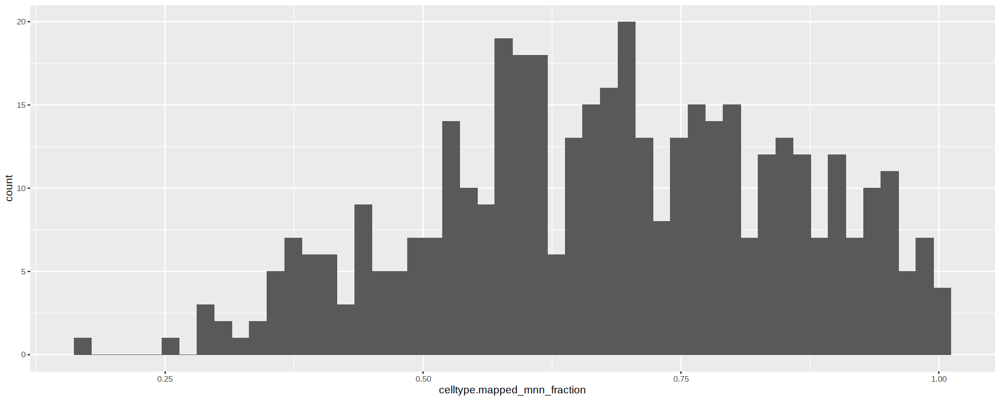

In [383]:
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + geom_histogram(bins=50)

In [384]:
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)


Converting group.by to factor...



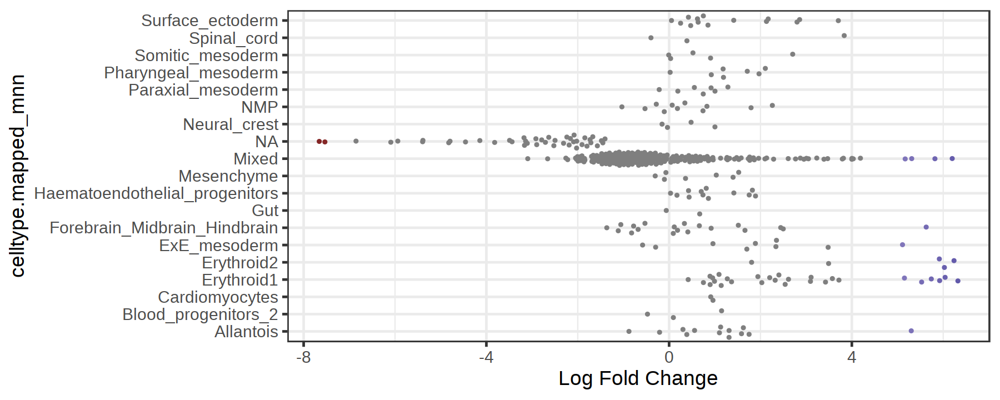

In [385]:
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")


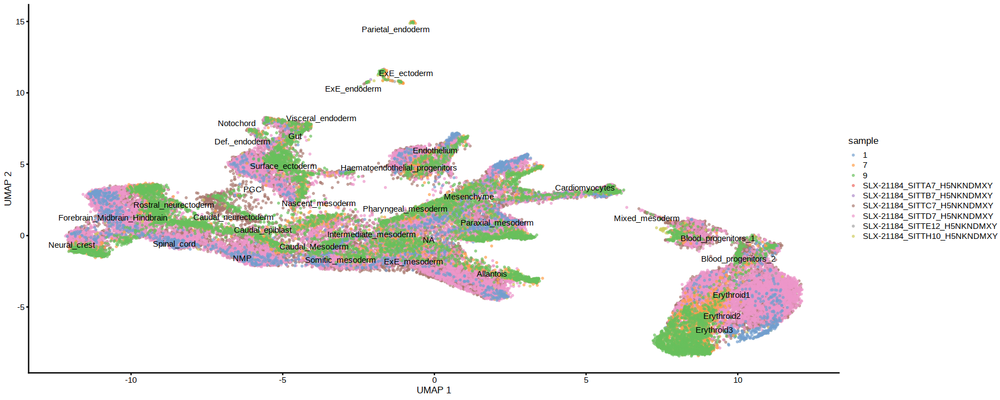

In [386]:
plotReducedDim(embryo_milo, dimred = "UMAP", colour_by="sample", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

# Select only new/old WT-injection data

### WT

In [387]:
wt_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/WT_injection'
wt_counts = readRDS(file.path(wt_in, 'raw_counts.rds'))
wt_genes = fread(file.path(wt_in, 'genes.tsv'), header=FALSE)
cell_names = fread(file.path(wt_in, 'meta.tab'))
wt_meta = fread(file.path(wt_in, 'meta_complete.csv'))
biomart = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt")

In [388]:
wt_meta$cell = paste0('WT_', wt_meta$cell)
wt_meta = wt_meta[,c('cell', 'barcode', 'sample', 'stage', 'tomato', 'celltype.mapped')]
colnames(wt_meta) = c('cell', 'barcode', 'sample', 'stage', 'tdTom', 'celltype.mapped_mnn')
wt_meta$genotype = 'WT'

In [389]:
wt_genes$idx = 1:nrow(wt_genes)
wt_genes = merge(wt_genes, biomart, by.x='V1', by.y='ens_id', all.x=TRUE) %>% .[order(idx)]
wt_genes[is.na(symbol)]$symbol = wt_genes[is.na(symbol)]$V1

In [390]:
colnames(wt_counts) = paste0('WT_', cell_names$cell)
rownames(wt_counts) = wt_genes$symbol

In [391]:
wt_meta = wt_meta[stage == 'E8.5' & tdTom == TRUE & sample %in% c(7,8,9,10)] %>%
    data.frame() %>% tibble::column_to_rownames('cell') %>% .[,c('barcode', 'sample', 'celltype.mapped_mnn','genotype')]

In [392]:
wt_counts = wt_counts[,rownames(wt_meta)]

In [393]:
wt_sce = SingleCellExperiment(list(counts = wt_counts), colData = wt_meta)

In [394]:
wt_sce

class: SingleCellExperiment 
dim: 31053 9577 
metadata(0):
assays(1): counts
rownames(31053): Xkr4 Gm1992 ... ENSMUSG00000096730 ENSMUSG00000095742
rowData names(0):
colnames(9577): WT_cell_13270 WT_cell_13271 ... WT_cell_23599
  WT_cell_23600
colData names(4): barcode sample celltype.mapped_mnn genotype
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

### Runx1

In [395]:
runx_sce = readRDS(file.path(data_in, 'SingleCellExperiment.rds'))

In [396]:
runx_meta = fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/mapping/sample_metadata_after_mapping.txt.gz")

In [397]:
runx_meta = runx_meta %>% .[,idx:=1:nrow(.)] %>% 
    .[pass_rnaQC==TRUE & doublet_call==FALSE] %>% data.frame() 

In [398]:
clusters = list()
for(i in samples){
    clusters[[i]] = fread(sprintf('%s/%s_common_variants/clusters.tsv', clusters_in, i)) %>%
                        .[,c('sample', 'cell'):=list(i, sprintf('SLX-21184_%s_H5NKNDMXY#%s', i, .$barcode))] %>%
                        .[,clust_diff:=abs(cluster1-cluster0)]
    
}
clusters = rbindlist(clusters) %>% .[, c('cell', 'assignment')]

In [399]:
runx_meta = merge(runx_meta, clusters, by='cell')%>%
    tibble::column_to_rownames('cell') 

In [400]:
runx_sce = runx_sce[,rownames(runx_meta)]

In [401]:
runx_meta = runx_meta[order(colnames(runx_sce)),]

In [402]:
runx_sce

class: SingleCellExperiment 
dim: 29453 34892 
metadata(0):
assays(1): counts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(9): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [403]:
colData(runx_sce) = runx_meta %>% DataFrame

In [404]:
colData(runx_sce)$tomato = ifelse(runx_sce@assays@data$counts['tomato-td',]>0, TRUE, FALSE)

In [405]:
unique(colData(runx_sce)$sample)

[1] "SLX-21184_SITTA7_H5NKNDMXY"  "SLX-21184_SITTB7_H5NKNDMXY" 
[3] "SLX-21184_SITTC7_H5NKNDMXY"  "SLX-21184_SITTD7_H5NKNDMXY" 
[5] "SLX-21184_SITTE12_H5NKNDMXY" "SLX-21184_SITTH10_H5NKNDMXY"

In [406]:
colData(runx_sce)$genotype = ifelse(colData(runx_sce)$tomato==TRUE | 
                   colData(runx_sce)$sample %in% c('SLX-21184_SITTC7_H5NKNDMXY', 'SLX-21184_SITTD7_H5NKNDMXY') | 
                   colData(runx_sce)$sample == 'SITTH10' & colData(runx_sce)$assignment == 0, 
                   'Runx1_KO', 'Runx1_WT')

In [407]:
colData(runx_sce) = colData(runx_sce)[,c('barcode', 'sample', 'celltype.mapped_mnn','genotype')]

In [408]:
runx_sce = runx_sce[,colData(runx_sce)$genotype=='Runx1_KO']

### Merge

In [409]:
genes_keep = intersect(rownames(runx_sce), rownames(wt_sce))

In [410]:
exclude = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/WT_injection/old/tomato_DEGs_edgeR.csv")
exclude = exclude[sig==TRUE,gene]
genes_keep = genes_keep[!genes_keep %in% exclude]

In [411]:
sce = cbind(runx_sce[genes_keep, ], wt_sce[genes_keep, ])

In [412]:
args = list()
args$features <- 3000
args$npcs <- 30
args$batch_correction = 'genotype'
args$n_neighbors = 30
args$min_dist = 0.3

In [413]:
counts <- assay(sce, "counts")
libsizes <- colSums(counts)
size.factors <- libsizes/mean(libsizes)
logcounts(sce) <- log2(t(t(counts)/size.factors) + 1)

In [414]:
decomp <- modelGeneVar(sce, block=colData(sce)[[args$batch_correction]])
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

In [415]:
pca <- multiBatchPCA(sce_filt, batch = colData(sce_filt)[[args$batch_correction]], d = args$npcs)
pca.corrected <- reducedMNN(pca)$corrected
colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))
reducedDim(sce_filt, "pca.corrected") <- pca.corrected

In [416]:
sce_filt <- runUMAP(sce_filt, dimred="pca.corrected", n_neighbors = args$n_neighbors, min_dist = args$min_dist)

Warning message:
“ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


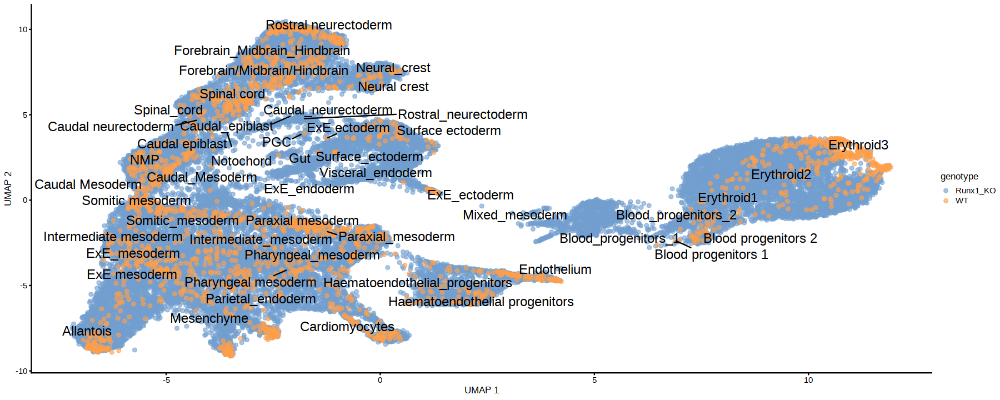

In [325]:
# old E8.5 data
plotReducedDim(sce_filt, colour_by="genotype", dimred = "UMAP",  text_by = "celltype.mapped_mnn", 
                          text_size = 5)

Warning message:
“ggrepel: 28 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


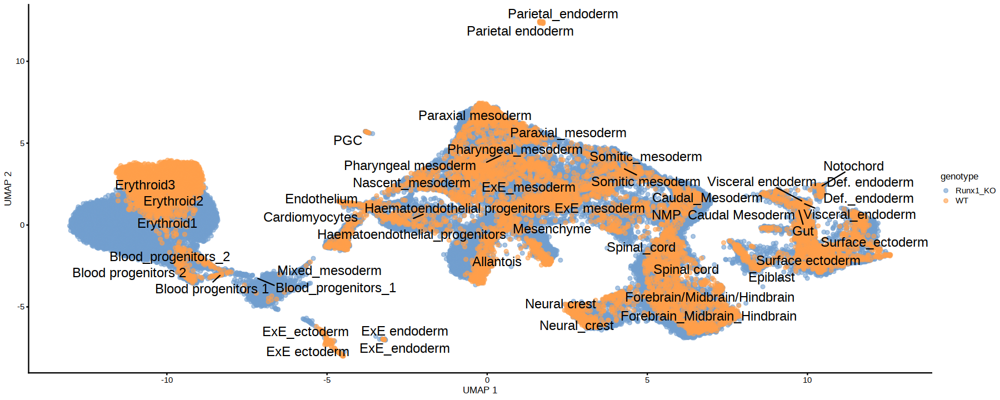

In [417]:
# new E8.5 data
plotReducedDim(sce_filt, colour_by="genotype", dimred = "UMAP",  text_by = "celltype.mapped_mnn", 
                          text_size = 5)

In [40]:
embryo_milo <- Milo(sce_filt)
embryo_milo

class: Milo 
dim: 3000 34791 
metadata(0):
assays(2): counts logcounts
rownames(3000): Tmsb4x Actb ... Tpcn2 Pcdhgc3
rowData names(0):
colnames(34791): SLX-21184_SITTA7_H5NKNDMXY#ACATGCAGTAAGGCTG-1
  SLX-21184_SITTA7_H5NKNDMXY#ACCACAAGTAGGAGGG-1 ... WT_cell_28144
  WT_cell_28145
colData names(4): barcode sample celltype.mapped_mnn genotype
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1

In [41]:
colnames(colData(embryo_milo))

[1] "barcode"             "sample"              "celltype.mapped_mnn"
[4] "genotype"

In [42]:
colData(embryo_milo)$sample_ko = paste0(colData(embryo_milo)$sample.x, '_',  colData(embryo_milo)$KO_corr)

In [43]:
embryo_milo <- buildGraph(embryo_milo, k = 30, d = 30, reduced.dim = "pca.corrected")

Constructing kNN graph with k:30



In [44]:
# lower prop for larger datasets
embryo_milo <- makeNhoods(embryo_milo, prop = 0.01, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

Checking valid object



In [45]:
colnames(colData(embryo_milo))

[1] "barcode"             "sample"              "celltype.mapped_mnn"
[4] "genotype"            "sample_ko"

In [46]:
embryo_milo <- countCells(embryo_milo, meta.data = as.data.frame(colData(embryo_milo)), sample="sample")

Checking meta.data validity

Counting cells in neighbourhoods



In [47]:
head(nhoodCounts(embryo_milo))

6 x 8 sparse Matrix of class "dgCMatrix"
  SLX-21184_SITTA7_H5NKNDMXY SLX-21184_SITTB7_H5NKNDMXY
1                          .                          .
2                          .                          .
3                          .                          .
4                          .                          .
5                          .                          .
6                          .                          .
  SLX-21184_SITTC7_H5NKNDMXY SLX-21184_SITTD7_H5NKNDMXY
1                         23                         24
2                         25                         59
3                         73                         12
4                         27                         15
5                         39                         83
6                          3                         19
  SLX-21184_SITTE12_H5NKNDMXY SLX-21184_SITTH10_H5NKNDMXY 8 10
1                           .                           . .  .
2                           .                    

In [48]:
embryo_design <- data.frame(colData(embryo_milo))[,c("sample", "genotype")]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample

embryo_design

,sample,genotype
,<chr>,<chr>
SLX-21184_SITTA7_H5NKNDMXY,SLX-21184_SITTA7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTB7_H5NKNDMXY,SLX-21184_SITTB7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTC7_H5NKNDMXY,SLX-21184_SITTC7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTD7_H5NKNDMXY,SLX-21184_SITTD7_H5NKNDMXY,Runx1_KO
SLX-21184_SITTE12_H5NKNDMXY,SLX-21184_SITTE12_H5NKNDMXY,Runx1_KO
SLX-21184_SITTH10_H5NKNDMXY,SLX-21184_SITTH10_H5NKNDMXY,Runx1_KO
8,8,WT
10,10,WT


In [49]:
embryo_milo <- calcNhoodDistance(embryo_milo, d=30, reduced.dim = "pca.corrected")

In [50]:
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(embryo_milo, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
head(da_results)

Using TMM normalisation

Warning message in max(abs(logR)):
“no non-missing arguments to max; returning -Inf”
Warning message in max(abs(logR)):
“no non-missing arguments to max; returning -Inf”
Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-5.784977,12.04663,17.068189,3.750887e-05,0.0001509180,1,1.324277e-04
2,-6.532421,12.60827,17.966151,2.348360e-05,0.0001126090,2,9.721525e-05
3,-1.842536,12.73876,4.305462,3.811452e-02,0.0719086847,3,6.788800e-02
4,-5.629812,11.94525,16.432433,5.229616e-05,0.0001864202,4,1.660406e-04
5,-6.958905,12.99730,18.140842,2.144197e-05,0.0001126090,5,9.721525e-05
6,2.946348,13.40589,13.412688,2.565476e-04,0.0008436469,6,7.647067e-04


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
204,6.340206,13.02325,34.03723,6.267540e-09,2.143499e-06,204,1.249875e-06
98,5.986328,13.86345,30.23312,4.308756e-08,6.838348e-06,98,3.929247e-06
146,4.898361,13.49877,29.58223,5.998551e-08,6.838348e-06,146,3.929247e-06
52,5.362354,13.86505,27.48848,1.742704e-07,1.490012e-05,52,8.496602e-06
225,5.314524,13.61128,26.86220,2.399193e-07,1.641048e-05,225,9.448585e-06
265,4.307923,13.09465,23.76953,1.169251e-06,6.664732e-05,265,3.849933e-05


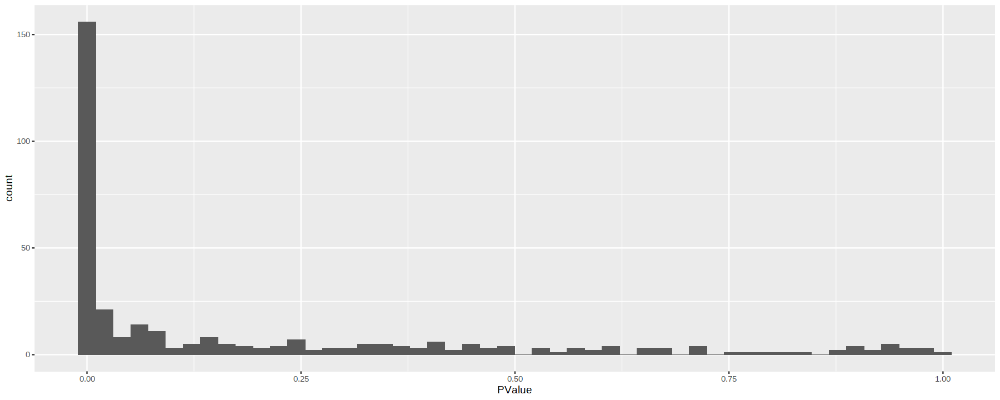

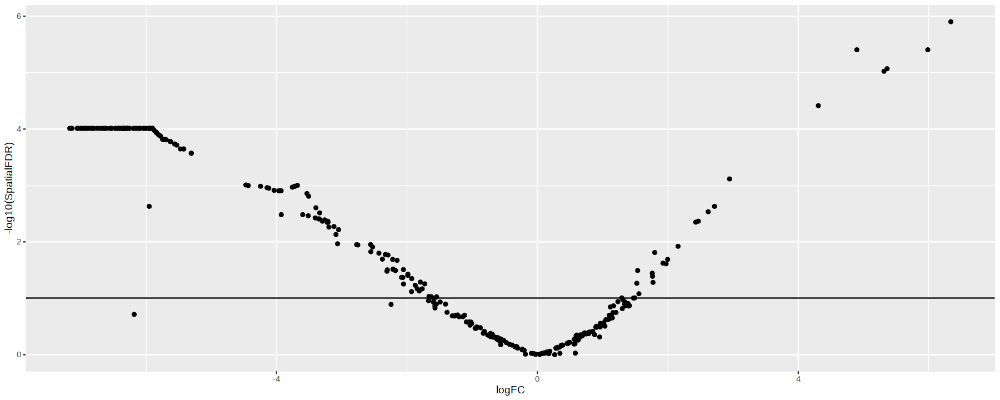

In [51]:
da_results %>%
  arrange(SpatialFDR) %>%
  head() 

ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)

ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) ## Mark significance threshold (10% FDR)

Warning message:
“ggrepel: 24 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


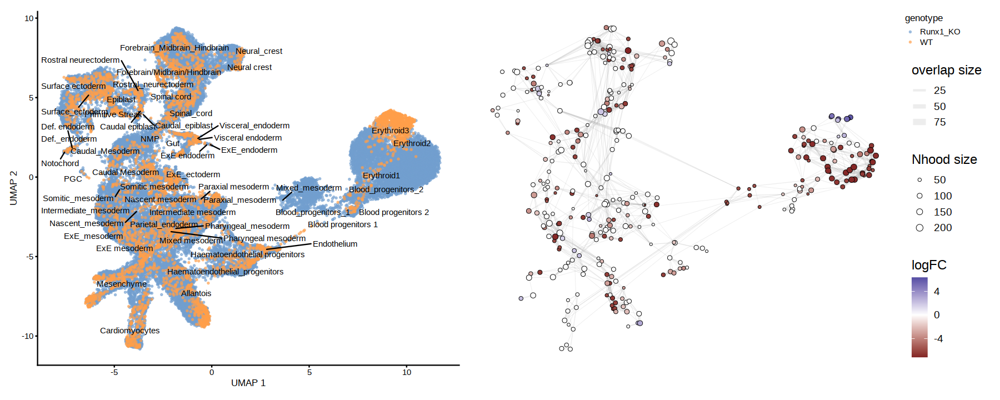

In [52]:
embryo_milo <- buildNhoodGraph(embryo_milo)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(embryo_milo, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [53]:
embryo_milo

class: Milo 
dim: 3000 34791 
metadata(0):
assays(2): counts logcounts
rownames(3000): Tmsb4x Actb ... Tpcn2 Pcdhgc3
rowData names(0):
colnames(34791): SLX-21184_SITTA7_H5NKNDMXY#ACATGCAGTAAGGCTG-1
  SLX-21184_SITTA7_H5NKNDMXY#ACCACAAGTAGGAGGG-1 ... WT_cell_28144
  WT_cell_28145
colData names(5): barcode sample celltype.mapped_mnn genotype sample_ko
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 34791 342
nhoodCounts dimensions(2): 342 8
nhoodDistances dimension(1): 342
graph names(1): graph
nhoodIndex names(1): 342
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 342 342

In [54]:
head(nhoodCounts(embryo_milo))

6 x 8 sparse Matrix of class "dgCMatrix"
  SLX-21184_SITTA7_H5NKNDMXY SLX-21184_SITTB7_H5NKNDMXY
1                          .                          .
2                          .                          .
3                          .                          .
4                          .                          .
5                          .                          .
6                          .                          .
  SLX-21184_SITTC7_H5NKNDMXY SLX-21184_SITTD7_H5NKNDMXY
1                         23                         24
2                         25                         59
3                         73                         12
4                         27                         15
5                         39                         83
6                          3                         19
  SLX-21184_SITTE12_H5NKNDMXY SLX-21184_SITTH10_H5NKNDMXY 8 10
1                           .                           . .  .
2                           .                    

#### test subsetting MILO object

In [263]:
test = embryo_milo

In [264]:
keep = colData(test)$sample %in% c(#'SLX-21184_SITTA7_H5NKNDMXY',
                                 #  'SLX-21184_SITTB7_H5NKNDMXY', 
                                  #  'SLX-21184_SITTC7_H5NKNDMXY',
                                    #'SLX-21184_SITTD7_H5NKNDMXY', 
                                   # 'SLX-21184_SITTE12_H5NKNDMXY',
                                   'SLX-21184_SITTH10_H5NKNDMXY', 
                                   #'8', 
                                   '10')

In [265]:
# test <- buildGraph(test, k = 30, d = 30, reduced.dim = "pca.corrected")
# # lower prop for larger datasets
# test <- makeNhoods(test, prop = 0.1, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

In [266]:
test = test[,keep]

In [267]:
nhoods(test) = nhoods(test)[keep,]

In [268]:
test

class: Milo 
dim: 3000 4425 
metadata(0):
assays(2): counts logcounts
rownames(3000): Tmsb4x Actb ... Tpcn2 Pcdhgc3
rowData names(0):
colnames(4425): SLX-21184_SITTH10_H5NKNDMXY#AAAGGATGTATGCGGA-1
  SLX-21184_SITTH10_H5NKNDMXY#AAAGTCCGTCATAAAG-1 ... WT_cell_28144
  WT_cell_28145
colData names(5): barcode sample celltype.mapped_mnn genotype sample_ko
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 4425 342
nhoodCounts dimensions(2): 342 8
nhoodDistances dimension(1): 342
graph names(1): graph
nhoodIndex names(1): 342
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 342 342

In [269]:
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample")

Checking meta.data validity

Counting cells in neighbourhoods



In [270]:
summary(rowSums(nhoodCounts(test))==0)

   Mode   FALSE    TRUE 
logical     250      92 

In [271]:
embryo_design <- data.frame(colData(test))[,c("sample", "genotype")]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample

embryo_design

,sample,genotype
,<chr>,<chr>
SLX-21184_SITTH10_H5NKNDMXY,SLX-21184_SITTH10_H5NKNDMXY,Runx1_KO
10,10,WT


In [272]:
test2 = nhoodCounts(test)<=2
nhoodCounts(test) = nhoodCounts(test)[!test2[,1] & !test2[,2],]

In [273]:
summary(rowSums(nhoodCounts(test))==0)

   Mode   FALSE 
logical       6 

In [274]:
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(test, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
head(da_results)

Using TMM normalisation

Warning message in estimateDisp.default(y = y$counts, design = design, group = group, :
“No residual df: setting dispersion to NA”


ERROR: Error in glmFit.default(y, design = design, dispersion = dispersion, offset = offset, : NA dispersions not allowed


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-5.232295,11.58821,12.92102,0.0003364558,0.003742402,1,0.003467371
2,-5.326860,11.64735,12.66873,0.0003845459,0.003742402,2,0.003467371
4,-5.413987,11.70357,12.46479,0.0004284570,0.003742402,4,0.003467371
13,-5.073233,11.49331,13.42160,0.0002582417,0.003742402,13,0.003467371
17,-4.952735,11.42531,13.82282,0.0002089956,0.003742402,17,0.003467371
18,-5.371277,11.67580,12.56564,0.0004061446,0.003742402,18,0.003467371


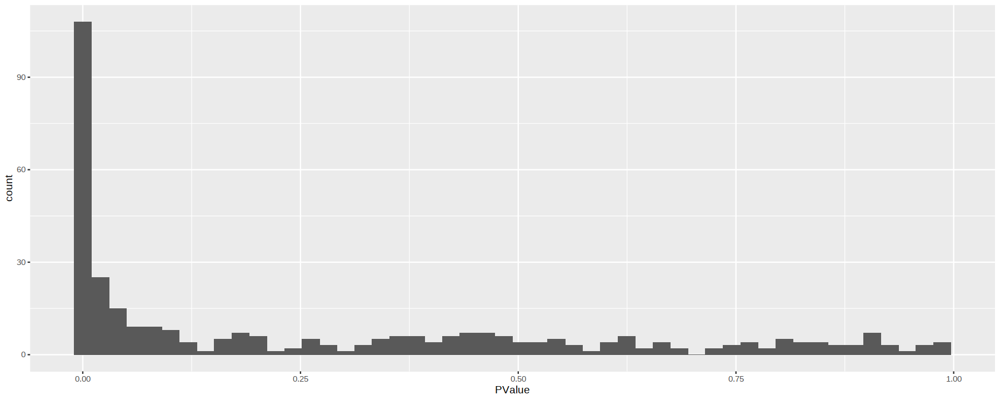

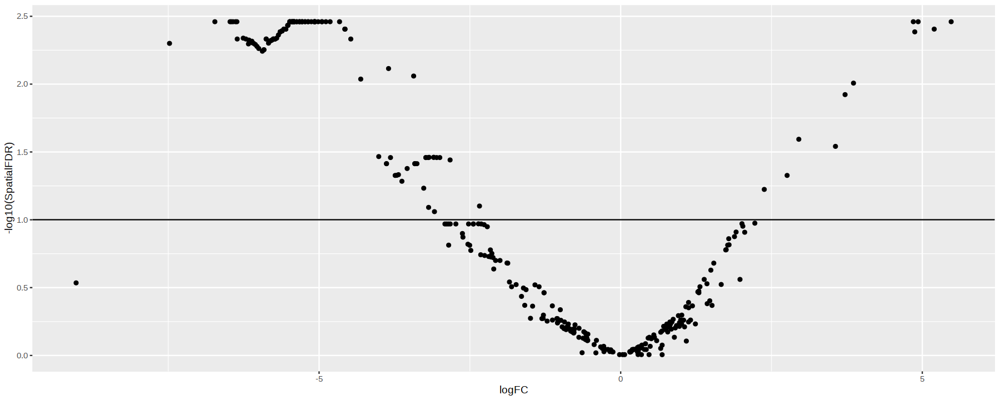

In [217]:
da_results %>%
  arrange(SpatialFDR) %>%
  head() 

ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)

ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) ## Mark significance threshold (10% FDR)

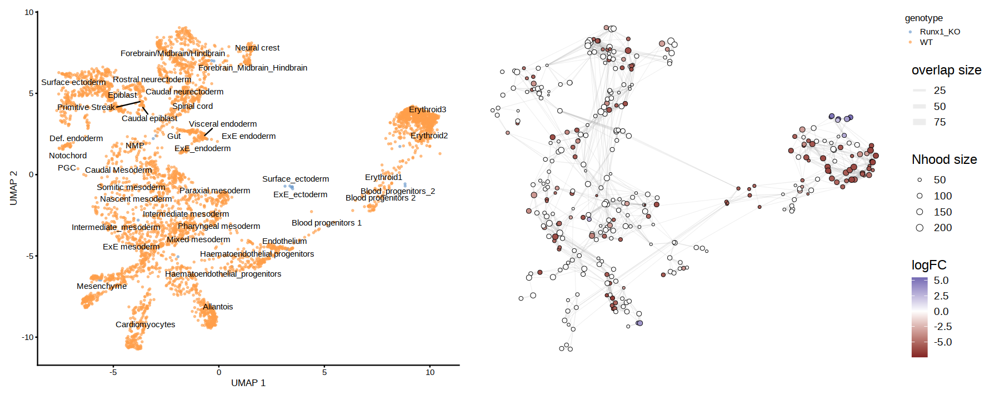

In [218]:
#test <- buildNhoodGraph(test)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(test, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Final test

For each neighborhood, we calculate logFC in our Exp and in WT. then devide these by each other and use this as an odds ratio

### WT

In [443]:
wt_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/WT_injection'
wt_counts = readRDS(file.path(wt_in, 'raw_counts.rds'))
wt_genes = fread(file.path(wt_in, 'genes.tsv'), header=FALSE)
cell_names = fread(file.path(wt_in, 'meta.tab'))
wt_meta = fread(file.path(wt_in, 'meta_complete.csv'))
biomart = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt")

In [444]:
wt_meta$cell = paste0('WT_', wt_meta$cell)
wt_meta = wt_meta[,c('cell', 'barcode', 'sample', 'stage', 'tomato', 'celltype.mapped')]
colnames(wt_meta) = c('cell', 'barcode', 'sample', 'stage', 'tdTom', 'celltype.mapped_mnn')
wt_meta$exp = 'WT'

In [445]:
wt_genes$idx = 1:nrow(wt_genes)
wt_genes = merge(wt_genes, biomart, by.x='V1', by.y='ens_id', all.x=TRUE) %>% .[order(idx)]
wt_genes[is.na(symbol)]$symbol = wt_genes[is.na(symbol)]$V1

In [446]:
colnames(wt_counts) = paste0('WT_', cell_names$cell)
rownames(wt_counts) = wt_genes$symbol

In [447]:
wt_meta$genotype = ifelse(wt_meta$tdTom==TRUE, 'Inj', 'Host')
wt_meta = wt_meta[stage == 'E8.5'] %>%
    data.frame() %>% tibble::column_to_rownames('cell') %>% .[,c('barcode', 'sample', 'celltype.mapped_mnn','exp', 'genotype')]

In [448]:
wt_counts = wt_counts[,rownames(wt_meta)]

In [449]:
wt_sce = SingleCellExperiment(list(counts = wt_counts), colData = wt_meta)

In [450]:
wt_sce# = wt_sce[,colData(wt_sce)$genotype=='Inj']

class: SingleCellExperiment 
dim: 31053 17359 
metadata(0):
assays(1): counts
rownames(31053): Xkr4 Gm1992 ... ENSMUSG00000096730 ENSMUSG00000095742
rowData names(0):
colnames(17359): WT_cell_1 WT_cell_2 ... WT_cell_28144 WT_cell_28145
colData names(5): barcode sample celltype.mapped_mnn exp genotype
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

### Runx1

In [451]:
runx_sce = readRDS(file.path(data_in, 'SingleCellExperiment.rds'))

In [452]:
runx_meta = fread("/rds/project/rds-SDzz0CATGms/users/bt392/06_Runx1_RNA/results/rna/mapping/sample_metadata_after_mapping.txt.gz")

In [453]:
runx_meta = runx_meta %>% .[,idx:=1:nrow(.)] %>% 
    .[pass_rnaQC==TRUE & doublet_call==FALSE] %>% data.frame() 

In [454]:
clusters = list()
for(i in samples){
    clusters[[i]] = fread(sprintf('%s/%s_common_variants/clusters.tsv', clusters_in, i)) %>%
                        .[,c('sample', 'cell'):=list(i, sprintf('SLX-21184_%s_H5NKNDMXY#%s', i, .$barcode))] %>%
                        .[,clust_diff:=abs(cluster1-cluster0)]
    
}
clusters = rbindlist(clusters) %>% .[, c('cell', 'assignment')]

In [455]:
runx_meta = merge(runx_meta, clusters, by='cell')%>%
    tibble::column_to_rownames('cell') 

In [456]:
runx_sce = runx_sce[,rownames(runx_meta)]

In [457]:
runx_meta = runx_meta[order(colnames(runx_sce)),]

In [458]:
runx_sce

class: SingleCellExperiment 
dim: 29453 34892 
metadata(0):
assays(1): counts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(9): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [459]:
colData(runx_sce) = runx_meta %>% DataFrame

In [460]:
colData(runx_sce)$tomato = ifelse(runx_sce@assays@data$counts['tomato-td',]>0, TRUE, FALSE)

In [461]:
unique(colData(runx_sce)$sample)

[1] "SLX-21184_SITTA7_H5NKNDMXY"  "SLX-21184_SITTB7_H5NKNDMXY" 
[3] "SLX-21184_SITTC7_H5NKNDMXY"  "SLX-21184_SITTD7_H5NKNDMXY" 
[5] "SLX-21184_SITTE12_H5NKNDMXY" "SLX-21184_SITTH10_H5NKNDMXY"

In [462]:
colData(runx_sce)$genotype = ifelse(colData(runx_sce)$tomato==TRUE | 
                   colData(runx_sce)$sample %in% c('SLX-21184_SITTC7_H5NKNDMXY', 'SLX-21184_SITTD7_H5NKNDMXY') | 
                   colData(runx_sce)$sample == 'SITTH10' & colData(runx_sce)$assignment == 0, 
                   'Inj', 'Host')

In [463]:
colData(runx_sce) = colData(runx_sce)[,c('barcode', 'sample', 'celltype.mapped_mnn','genotype')]
colData(runx_sce)$exp = 'Runx1'

In [464]:
runx_sce #= runx_sce[,colData(runx_sce)$genotype=='Runx1_KO']

class: SingleCellExperiment 
dim: 29453 34892 
metadata(0):
assays(1): counts
rownames(29453): Xkr4 Gm1992 ... CAAA01147332.1 tomato-td
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(5): barcode sample celltype.mapped_mnn genotype exp
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

### Merge

In [465]:
genes_keep = intersect(rownames(runx_sce), rownames(wt_sce))

In [466]:
exclude = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/WT_injection/old/tomato_DEGs_edgeR.csv")
head(exclude)
exclude = exclude[sig==TRUE,gene]
genes_keep = genes_keep[!genes_keep %in% exclude]

gene,logFC,p.value,padj_fdr,log_padj_fdr,groupA_N,groupB_N,groupA,groupB,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<lgl>,<lgl>,<lgl>
Xist,5.609,0,0,Inf,2454,1077,TRUE,FALSE,TRUE
Cdkn1c,4.669,0,0,Inf,2454,1077,TRUE,FALSE,TRUE
H1f5,-3.592,0,0,Inf,2454,1077,TRUE,FALSE,TRUE
H1f4,-3.550,0,0,Inf,2454,1077,TRUE,FALSE,TRUE
Gm47283,-2.384,0,0,Inf,2454,1077,TRUE,FALSE,TRUE
Dhx9,-1.756,0,0,Inf,2454,1077,TRUE,FALSE,TRUE


In [467]:
sce = cbind(runx_sce[genes_keep, ], wt_sce[genes_keep, ])

In [468]:
args = list()
args$features <- 3000
args$npcs <- 30
args$batch_correction = 'exp'
args$n_neighbors = 30
args$min_dist = 0.3

In [469]:
counts <- assay(sce, "counts")
libsizes <- colSums(counts)
size.factors <- libsizes/mean(libsizes)
logcounts(sce) <- log2(t(t(counts)/size.factors) + 1)

In [470]:
decomp <- modelGeneVar(sce, block=colData(sce)[[args$batch_correction]])
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=args$features) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

In [471]:
pca <- multiBatchPCA(sce_filt, batch = colData(sce_filt)[[args$batch_correction]], d = args$npcs)
pca.corrected <- reducedMNN(pca)$corrected
colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))
reducedDim(sce_filt, "pca.corrected") <- pca.corrected

In [472]:
sce_filt <- runUMAP(sce_filt, dimred="pca.corrected", n_neighbors = args$n_neighbors, min_dist = args$min_dist)

Warning message:
“ggrepel: 20 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


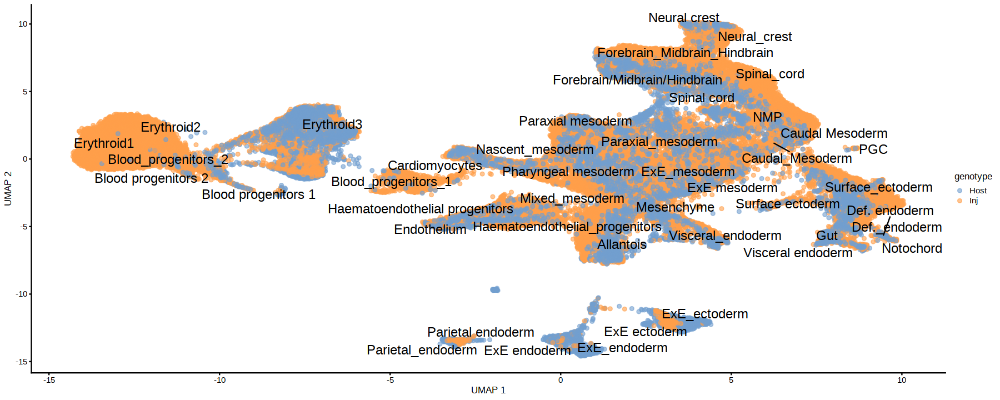

In [473]:
plotReducedDim(sce_filt, colour_by="genotype", dimred = "UMAP",  text_by = "celltype.mapped_mnn", 
                          text_size = 5)

Warning message:
“ggrepel: 20 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


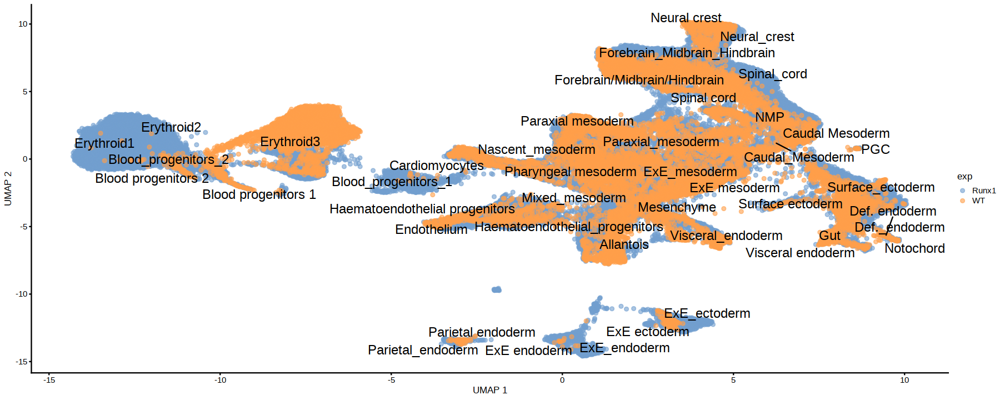

In [483]:
plotReducedDim(sce_filt, colour_by="exp", dimred = "UMAP",  text_by = "celltype.mapped_mnn", 
                          text_size = 5)

In [474]:
embryo_milo <- Milo(sce_filt)
embryo_milo

class: Milo 
dim: 3000 52251 
metadata(0):
assays(2): counts logcounts
rownames(3000): Mdk Actb ... Tctn1 Rpl23a
rowData names(0):
colnames(52251): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ... WT_cell_28144
  WT_cell_28145
colData names(5): barcode sample celltype.mapped_mnn genotype exp
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 1 1
nhoodCounts dimensions(2): 1 1
nhoodDistances dimension(1): 0
graph names(0):
nhoodIndex names(1): 0
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(0):
nhoodAdjacency dimension(2): 1 1

In [475]:
colnames(colData(embryo_milo))

[1] "barcode"             "sample"              "celltype.mapped_mnn"
[4] "genotype"            "exp"

In [476]:
embryo_milo <- buildGraph(embryo_milo, k = 30, d = 30, reduced.dim = "pca.corrected")

Constructing kNN graph with k:30



In [478]:
# lower prop for larger datasets
embryo_milo <- makeNhoods(embryo_milo, prop = 0.1, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

Checking valid object



In [479]:
colnames(colData(embryo_milo))

[1] "barcode"             "sample"              "celltype.mapped_mnn"
[4] "genotype"            "exp"

In [494]:
colData(embryo_milo)$sample_design = paste0(colData(embryo_milo)$sample, '_', colData(embryo_milo)$genotype)

In [495]:
embryo_milo <- countCells(embryo_milo, meta.data = as.data.frame(colData(embryo_milo)), sample="sample_design")

Checking meta.data validity

Counting cells in neighbourhoods



In [496]:
head(nhoodCounts(embryo_milo))

   [[ suppressing 16 column names ‘SLX-21184_SITTA7_H5NKNDMXY_Host’, ‘SLX-21184_SITTA7_H5NKNDMXY_Inj’, ‘SLX-21184_SITTB7_H5NKNDMXY_Host’ ... ]]



6 x 16 sparse Matrix of class "dgCMatrix"
                                        
1 15 . 10 .  .  . . . . . . . 28 . 17  .
2  . .  . . 31 30 . . . . 3 .  . .  2  1
3  . .  . . 17 22 . . . . . .  3 3  2 13
4  1 .  . . 10 25 . . . . 4 .  1 .  3 10
5  . .  . . 14 26 . . 2 . 5 .  . .  .  .
6  . .  . . 37 53 . . . . . 1  6 . 26  7

In [498]:
embryo_design <- data.frame(colData(embryo_milo))[,c("sample_design", "sample", "exp", "genotype")]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_design

embryo_design

,sample_design,sample,exp,genotype
,<chr>,<chr>,<chr>,<chr>
SLX-21184_SITTA7_H5NKNDMXY_Host,SLX-21184_SITTA7_H5NKNDMXY_Host,SLX-21184_SITTA7_H5NKNDMXY,Runx1,Host
SLX-21184_SITTA7_H5NKNDMXY_Inj,SLX-21184_SITTA7_H5NKNDMXY_Inj,SLX-21184_SITTA7_H5NKNDMXY,Runx1,Inj
SLX-21184_SITTB7_H5NKNDMXY_Host,SLX-21184_SITTB7_H5NKNDMXY_Host,SLX-21184_SITTB7_H5NKNDMXY,Runx1,Host
SLX-21184_SITTB7_H5NKNDMXY_Inj,SLX-21184_SITTB7_H5NKNDMXY_Inj,SLX-21184_SITTB7_H5NKNDMXY,Runx1,Inj
SLX-21184_SITTC7_H5NKNDMXY_Inj,SLX-21184_SITTC7_H5NKNDMXY_Inj,SLX-21184_SITTC7_H5NKNDMXY,Runx1,Inj
SLX-21184_SITTD7_H5NKNDMXY_Inj,SLX-21184_SITTD7_H5NKNDMXY_Inj,SLX-21184_SITTD7_H5NKNDMXY,Runx1,Inj
SLX-21184_SITTE12_H5NKNDMXY_Inj,SLX-21184_SITTE12_H5NKNDMXY_Inj,SLX-21184_SITTE12_H5NKNDMXY,Runx1,Inj
SLX-21184_SITTE12_H5NKNDMXY_Host,SLX-21184_SITTE12_H5NKNDMXY_Host,SLX-21184_SITTE12_H5NKNDMXY,Runx1,Host
SLX-21184_SITTH10_H5NKNDMXY_Host,SLX-21184_SITTH10_H5NKNDMXY_Host,SLX-21184_SITTH10_H5NKNDMXY,Runx1,Host


In [489]:
embryo_milo <- calcNhoodDistance(embryo_milo, d=30, reduced.dim = "pca.corrected")

In [499]:
# design = what to test for, can correct for another variable as well
da_results_genotype_whole <- testNhoods(embryo_milo, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
da_results_exp_whole <- testNhoods(embryo_milo, design = ~ exp, design.df = embryo_design, reduced.dim="pca.corrected")


Using TMM normalisation

Performing spatial FDR correction withk-distance weighting

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



Warning message:
“ggrepel: 18 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 18 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


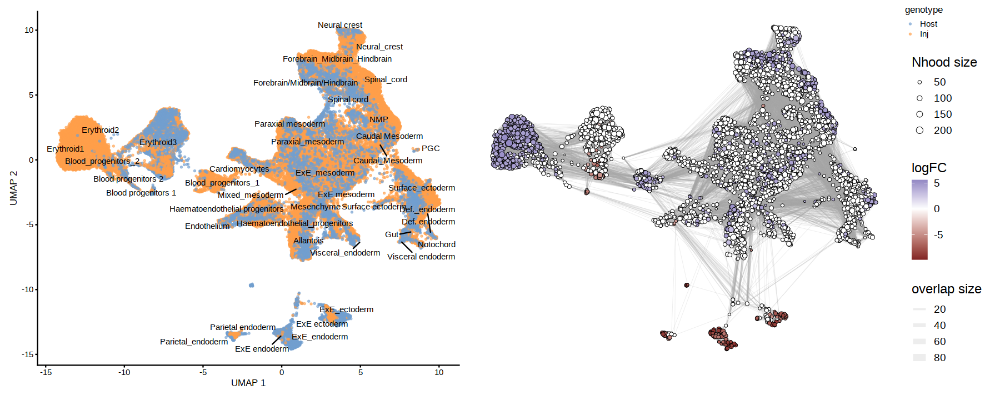

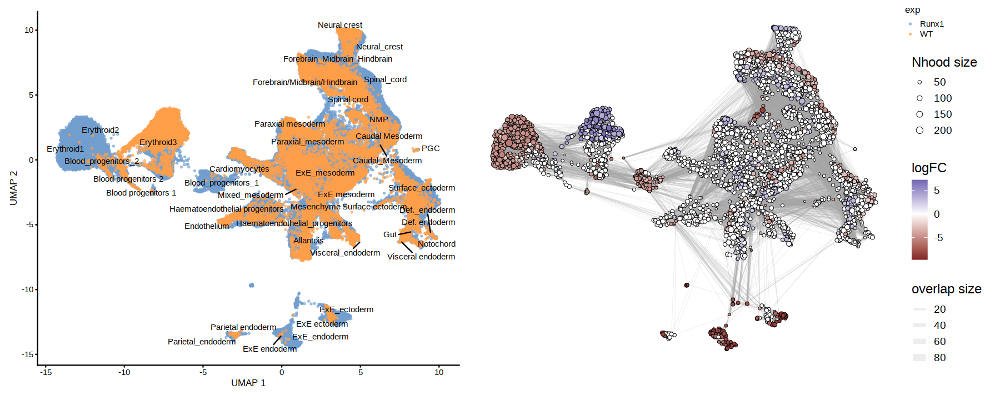

In [501]:
embryo_milo <- buildNhoodGraph(embryo_milo)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(embryo_milo, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results_genotype_whole, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")


## Plot single-cell UMAP
umap_pl <- plotReducedDim(embryo_milo, dimred = "UMAP", colour_by="exp", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results_exp_whole, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [551]:
test = embryo_milo

In [552]:
keep = colData(test)$exp == 'Runx1'

In [553]:
# test <- buildGraph(test, k = 30, d = 30, reduced.dim = "pca.corrected")
# # lower prop for larger datasets
# test <- makeNhoods(test, prop = 0.1, k = 30, d=30, refined = TRUE, reduced_dims = "pca.corrected")

In [554]:
test = test[,keep]

In [555]:
nhoods(test) = nhoods(test)[keep,]

In [556]:
test

class: Milo 
dim: 3000 34892 
metadata(0):
assays(2): counts logcounts
rownames(3000): Mdk Actb ... Tctn1 Rpl23a
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(6): barcode sample ... exp sample_design
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 34892 4012
nhoodCounts dimensions(2): 4012 16
nhoodDistances dimension(1): 4012
graph names(1): graph
nhoodIndex names(1): 4012
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 4012 4012

In [557]:
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample_design")

Checking meta.data validity

Counting cells in neighbourhoods



In [558]:
summary(rowSums(nhoodCounts(test))==0)

   Mode   FALSE    TRUE 
logical    3945      67 

In [559]:
embryo_design <- data.frame(colData(test))[,c("sample_design", "sample", "genotype")]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_design

embryo_design

,sample_design,sample,genotype
,<chr>,<chr>,<chr>
SLX-21184_SITTA7_H5NKNDMXY_Host,SLX-21184_SITTA7_H5NKNDMXY_Host,SLX-21184_SITTA7_H5NKNDMXY,Host
SLX-21184_SITTA7_H5NKNDMXY_Inj,SLX-21184_SITTA7_H5NKNDMXY_Inj,SLX-21184_SITTA7_H5NKNDMXY,Inj
SLX-21184_SITTB7_H5NKNDMXY_Host,SLX-21184_SITTB7_H5NKNDMXY_Host,SLX-21184_SITTB7_H5NKNDMXY,Host
SLX-21184_SITTB7_H5NKNDMXY_Inj,SLX-21184_SITTB7_H5NKNDMXY_Inj,SLX-21184_SITTB7_H5NKNDMXY,Inj
SLX-21184_SITTC7_H5NKNDMXY_Inj,SLX-21184_SITTC7_H5NKNDMXY_Inj,SLX-21184_SITTC7_H5NKNDMXY,Inj
SLX-21184_SITTD7_H5NKNDMXY_Inj,SLX-21184_SITTD7_H5NKNDMXY_Inj,SLX-21184_SITTD7_H5NKNDMXY,Inj
SLX-21184_SITTE12_H5NKNDMXY_Inj,SLX-21184_SITTE12_H5NKNDMXY_Inj,SLX-21184_SITTE12_H5NKNDMXY,Inj
SLX-21184_SITTE12_H5NKNDMXY_Host,SLX-21184_SITTE12_H5NKNDMXY_Host,SLX-21184_SITTE12_H5NKNDMXY,Host
SLX-21184_SITTH10_H5NKNDMXY_Host,SLX-21184_SITTH10_H5NKNDMXY_Host,SLX-21184_SITTH10_H5NKNDMXY,Host


In [560]:
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(test, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-7.172341,11.90267,7.9473388,0.004818762,0.07268913,1,0.05074958
2,4.773007,10.70620,3.9289564,0.047469905,0.07757832,2,0.07609385
3,4.306568,10.43283,3.8695780,0.049177483,0.07757832,3,0.07609385
4,1.401457,10.48982,0.6664684,0.414291643,0.49424266,4,0.49086258
5,1.156611,10.56957,0.4764029,0.490061178,0.56824435,5,0.56636954
6,5.222840,10.98347,4.0249189,0.044841151,0.07757832,6,0.07609385


,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
197,-4.158799,10.12497,13.14391,0.0002889012,0.06850494,197,0.04727865
417,-4.369976,10.25074,12.83060,0.0003415002,0.06850494,417,0.04727865
1030,-4.158799,10.12497,13.14391,0.0002889012,0.06850494,1030,0.04727865
1239,-4.369976,10.25074,12.83060,0.0003415002,0.06850494,1239,0.04727865
1600,-4.475829,10.31105,12.90141,0.0003288244,0.06850494,1600,0.04727865
1899,-4.264107,10.18872,12.95892,0.0003188802,0.06850494,1899,0.04727865


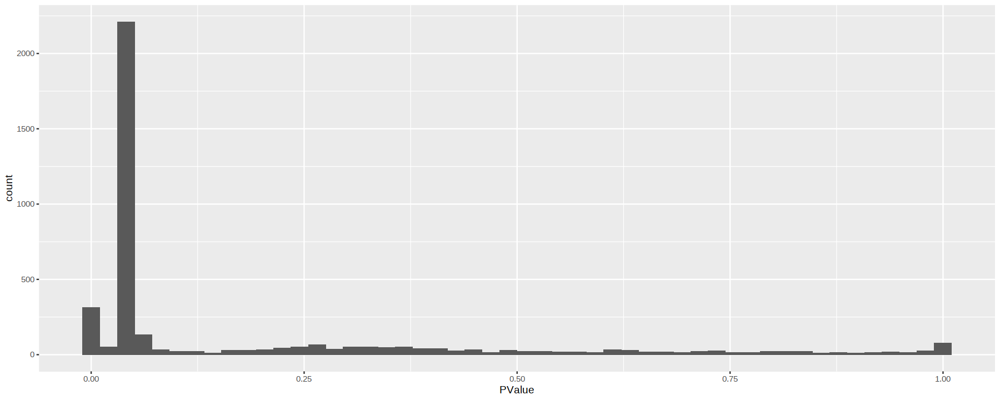

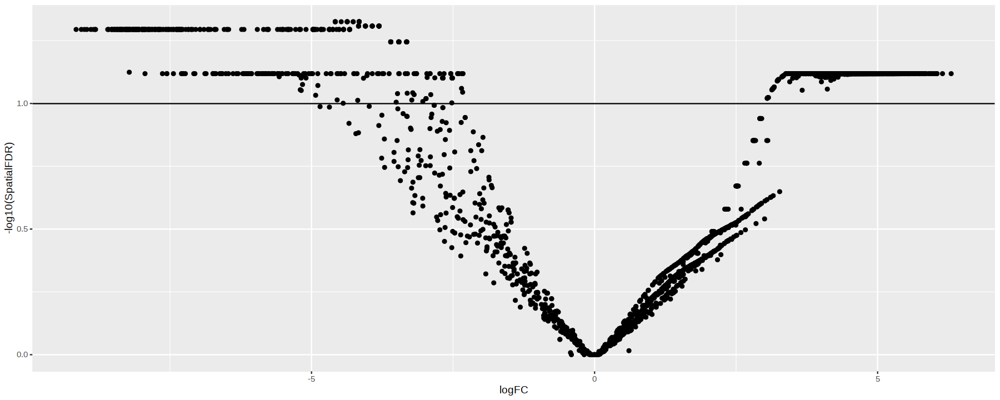

In [561]:
da_results %>%
  arrange(SpatialFDR) %>%
  head() 

ggplot(da_results, aes(PValue)) + geom_histogram(bins=50)

ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
  geom_point() +
  geom_hline(yintercept = 1) ## Mark significance threshold (10% FDR)

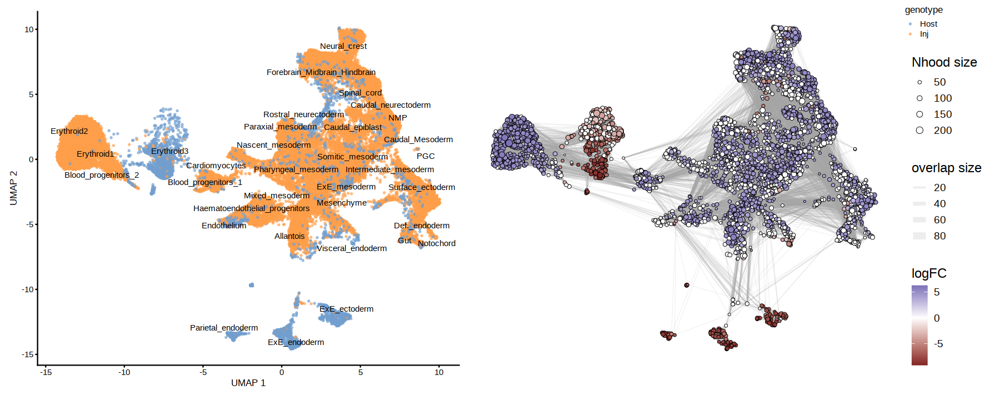

In [562]:
#test <- buildNhoodGraph(test)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(test, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [568]:
test = embryo_milo
keep = colData(test)$exp == 'Runx1'
test = test[,keep]
test
nhoods(test) = nhoods(test)[keep,]
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample_design")
head(nhoodCounts(test))
test = embryo_milo
keep = colData(test)$exp == 'WT'
test = test[,keep]
test
nhoods(test) = nhoods(test)[keep,]
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample_design")
head(nhoodCounts(test))


class: Milo 
dim: 3000 34892 
metadata(0):
assays(2): counts logcounts
rownames(3000): Mdk Actb ... Tctn1 Rpl23a
rowData names(0):
colnames(34892): SLX-21184_SITTA7_H5NKNDMXY#AAACGAACAATTGCAC-1
  SLX-21184_SITTA7_H5NKNDMXY#AAACGAACACCAGCTG-1 ...
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGAGGATTTAG-1
  SLX-21184_SITTH10_H5NKNDMXY#TTTGTTGCAAGTACCT-1
colData names(6): barcode sample ... exp sample_design
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 52251 4012
nhoodCounts dimensions(2): 4012 16
nhoodDistances dimension(1): 4012
graph names(1): graph
nhoodIndex names(1): 4012
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 4012 4012

Checking meta.data validity

Counting cells in neighbourhoods

   [[ suppressing 10 column names ‘SLX-21184_SITTA7_H5NKNDMXY_Host’, ‘SLX-21184_SITTA7_H5NKNDMXY_Inj’, ‘SLX-21184_SITTB7_H5NKNDMXY_Host’ ... ]]



6 x 10 sparse Matrix of class "dgCMatrix"
                         
1 15 . 10 .  .  . . . . .
2  . .  . . 31 30 . . . .
3  . .  . . 17 22 . . . .
4  1 .  . . 10 25 . . . .
5  . .  . . 14 26 . . 2 .
6  . .  . . 37 53 . . . .

class: Milo 
dim: 3000 17359 
metadata(0):
assays(2): counts logcounts
rownames(3000): Mdk Actb ... Tctn1 Rpl23a
rowData names(0):
colnames(17359): WT_cell_1 WT_cell_2 ... WT_cell_28144 WT_cell_28145
colData names(6): barcode sample ... exp sample_design
reducedDimNames(2): pca.corrected UMAP
mainExpName: RNA
altExpNames(0):
nhoods dimensions(2): 52251 4012
nhoodCounts dimensions(2): 4012 16
nhoodDistances dimension(1): 4012
graph names(1): graph
nhoodIndex names(1): 4012
nhoodExpression dimension(2): 1 1
nhoodReducedDim names(0):
nhoodGraph names(1): nhoodGraph
nhoodAdjacency dimension(2): 4012 4012

Checking meta.data validity

Counting cells in neighbourhoods



6 x 6 sparse Matrix of class "dgCMatrix"
  1_Inj 2_Host 7_Inj 8_Host 9_Inj 10_Host
1     .      .    28      .    17       .
2     3      .     .      .     2       1
3     .      .     3      3     2      13
4     4      .     1      .     3      10
5     5      .     .      .     .       .
6     .      1     6      .    26       7

Checking meta.data validity

Counting cells in neighbourhoods

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting

Checking meta.data validity

Counting cells in neighbourhoods

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



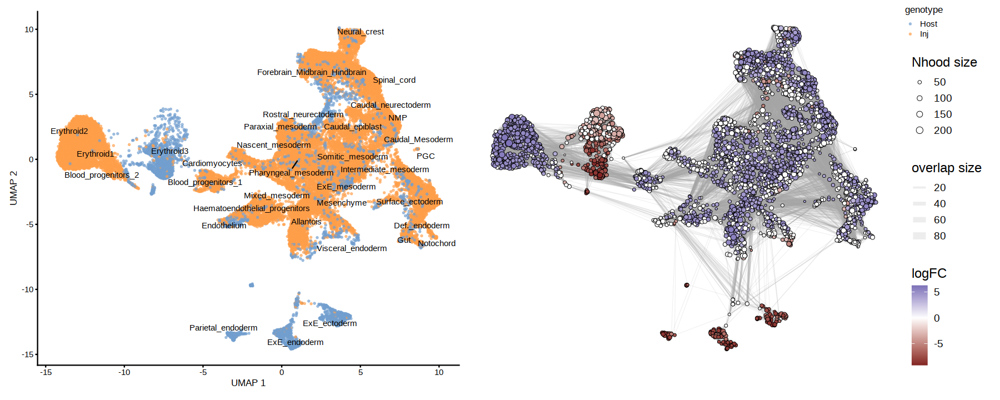

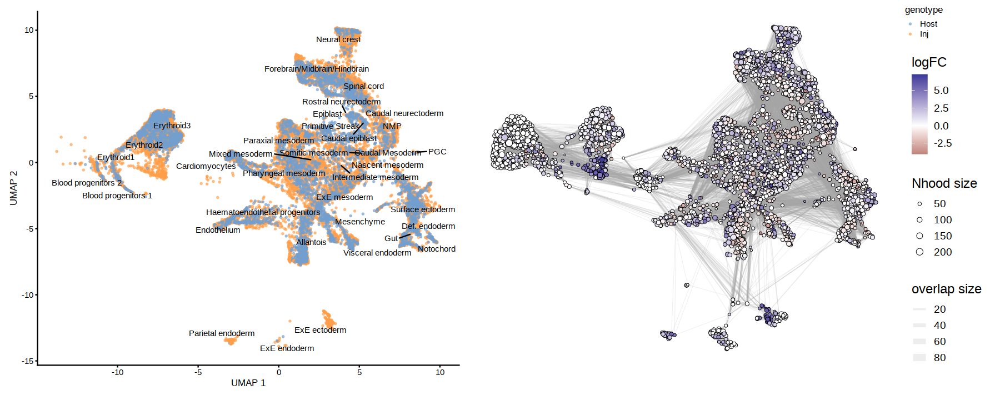

In [596]:
#############
### RUNX1 ###
#############

test = embryo_milo
keep = colData(test)$exp == 'Runx1'
test = test[,keep]
nhoods(test) = nhoods(test)[keep,]
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample_design")

embryo_design <- data.frame(colData(test))[,c("sample_design", "sample", "genotype")]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_design

# design = what to test for, can correct for another variable as well
da_results <- testNhoods(test, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")

#test <- buildNhoodGraph(test)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(test, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

#############
#### WT #####
#############
test = embryo_milo
keep = colData(test)$exp == 'WT'
test = test[,keep]
nhoods(test) = nhoods(test)[keep,]
test <- countCells(test, meta.data = as.data.frame(colData(test)), sample="sample_design")

embryo_design <- data.frame(colData(test))[,c("sample_design", "sample", "genotype")]

## Convert batch info from integer to factor
#embryo_design$KO <- as.factor(embryo_design$KO) 

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_design

# design = what to test for, can correct for another variable as well
da_results <- testNhoods(test, design = ~ genotype, design.df = embryo_design, reduced.dim="pca.corrected")
da_results$SpatialFDR = 0 ### This should not be needed but something is wrong with significance
#test <- buildNhoodGraph(test)

## Plot single-cell UMAP
umap_pl <- plotReducedDim(test, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

In [579]:
da_results <- annotateNhoods(embryo_milo, da_results, coldata_col = "celltype.mapped_mnn")
head(da_results)

Converting celltype.mapped_mnn to factor...



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,celltype.mapped_mnn,celltype.mapped_mnn_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,6.64932132,9.185499,6.048638192,0.01392750,1,1,1,ExE ectoderm,0.6428571
2,1.78076488,7.681372,0.690460460,0.40602017,1,2,1,Surface_ectoderm,0.7611940
3,-2.26573170,8.692261,1.364050298,0.24285411,1,3,1,Intermediate_mesoderm,0.2166667
4,-0.08883981,8.278616,0.002947507,0.95670404,1,4,1,Allantois,0.9444444
5,4.11624779,7.750213,2.765289095,0.09634881,1,5,1,Surface_ectoderm,0.8723404
6,1.19500807,8.812577,0.407582957,0.52320797,1,6,1,Neural_crest,0.6923077


In [600]:
nrow(da_results[da_results$logFC == 0, ])

[1] 650

In [598]:
unique(da_results$logFC)

[1]  6.649321e+00  1.780765e+00 -2.265732e+00 -8.883981e-02  4.116248e+00
   [6]  1.195008e+00 -3.632837e-01  0.000000e+00  7.309690e+00  5.256505e-01
  [11] -4.103790e-01 -1.024816e+00  6.047651e-01  2.709766e-01  9.084000e-01
  [16]  3.823164e-01  1.839034e+00  8.929609e-01  1.387261e-02  7.653109e-01
  [21]  4.157003e+00 -1.142713e+00  7.478150e-02  3.150667e-01  2.811074e+00
  [26]  1.233565e+00  2.314651e+00  3.841222e-01 -7.452530e-03 -2.844482e-01
  [31]  5.951404e-01  1.124351e+00  3.947565e-02  4.908245e-01  1.811905e+00
  [36]  5.787969e-01 -2.198723e+00 -7.579284e-01 -4.048802e-01 -6.096552e-01
  [41]  4.438252e+00  1.367279e+00 -3.285269e+00  1.056270e+00  1.459267e+00
  [46]  8.857225e-01 -1.075959e+00 -5.097851e-02 -1.458938e+00  3.010158e+00
  [51] -1.049655e-01  1.342336e+00  1.074094e+00  5.084698e+00  9.992139e-01
  [56]  3.052963e-01  1.977817e+00  1.186617e-01  5.351707e-01  3.971133e-01
  [61] -7.556031e-01 -2.263999e-01 -1.922901e+00 -1.460536e+00  4.973691e+00
  [66] -5.231929e-01 -1.150547e+00  2.112702e+00  4.381823e+00  1.825676e+00
  [71]  1.616543e-01  2.511428e-01 -6.837191e-01 -1.324534e+00 -2.751904e+00
  [76]  2.250130e+00  1.246609e+00  1.183148e+00  1.447549e+00  1.327944e+00
  [81]  1.401449e+00  3.093382e+00  5.211924e-01  3.377373e+00  1.355857e+00
  [86]  2.232101e-01  6.912369e-01  9.218467e-01  3.578551e-01 -1.682629e-01
  [91]  1.969354e+00 -1.471439e-02  9.444009e-01  7.240003e-01 -1.658063e-01
  [96] -5.301629e-01  5.689355e-01  4.562822e-01  1.910580e+00 -4.312238e-01
 [101]  1.321785e+00  2.745772e+00 -1.099611e-01  1.924818e+00  3.037053e+00
 [106]  5.062749e-01  9.734686e-01  2.976786e+00  7.110862e-01  7.460270e-01
 [111]  1.675927e+00  2.587299e+00  1.554959e-01  5.620514e+00  1.342153e+00
 [116]  8.732351e-01  3.211772e+00 -1.699561e+00 -3.120005e+00  5.714941e+00
 [121] -5.998903e-01 -1.572732e+00  4.821024e+00  7.680599e-01 -9.738694e-01
 [126]  3.789877e+00  7.027463e-02  8.376749e-01 -1.977712e+00 -9.303399e-02
 [131]  2.464615e+00  3.113821e+00  6.789869e-01 -3.076049e-02 -9.937388e-02
 [136] -1.762688e-01  8.177807e-01 -1.722122e+00  1.365337e+00  7.069377e-01
 [141]  2.606314e-01  3.148862e+00 -1.273866e+00  9.941245e-01 -8.443101e-01
 [146]  7.847729e-01 -1.255142e-02 -7.807095e-02  1.385295e+00  1.662332e+00
 [151]  4.039545e-01  6.254689e-01 -7.998693e-01  5.982800e-01  2.030718e+00
 [156]  2.843390e-01  2.150432e-01 -3.152363e-01  9.983043e-01  1.129312e+00
 [161] -8.576227e-02  3.576835e+00 -5.880679e-01  1.733183e-01 -1.162120e+00
 [166]  1.839929e+00 -9.286314e-01  7.984286e-01  1.089276e+00 -1.294185e+00
 [171]  3.232939e+00 -4.833410e-01 -8.822362e-02  1.835167e+00  9.017716e-01
 [176] -9.180479e-01  8.111254e-01 -5.289379e-02  2.094678e+00  4.802186e+00
 [181] -1.716581e+00 -2.122668e-01  1.552526e-01 -2.094765e+00  4.075571e-01
 [186]  3.878041e-01  9.774011e-01 -2.934884e-02 -6.045202e-01  6.422891e-01
 [191]  1.120287e-01 -1.047739e+00  1.856954e+00 -3.246227e-01  6.986732e+00
 [196]  2.978252e+00  3.769737e-01 -3.366231e-01 -5.306268e-01 -1.760157e-01
 [201] -1.654471e-01  5.095520e-01 -1.024962e+00  1.355946e+00 -4.429001e-01
 [206]  1.896395e+00  1.924207e-01  3.305655e+00  2.370469e+00  3.036974e+00
 [211]  2.837751e+00  1.645753e+00  1.212497e+00  1.109451e+00  1.026067e+00
 [216]  5.919728e-01  3.393765e-01  1.420470e+00  2.770857e+00 -4.338925e-01
 [221]  6.887578e-01 -1.453662e+00  2.149271e-01  3.595851e+00  1.438920e-01
 [226]  1.887805e+00 -5.073844e-01 -8.017383e-01 -5.287793e-01  9.174751e-02
 [231]  5.519490e-01 -7.743361e-02 -1.872567e-01  2.182629e+00  9.920960e-01
 [236]  1.049372e-01 -1.509217e+00 -7.899948e-01 -2.410341e-01 -8.771810e-01
 [241] -3.222166e-01  8.800008e-01  6.507047e+00 -8.500886e-02 -2.682746e+00
 [246]  3.950227e-01 -7.033689e-01 -3.448867e-01 -5.993190e-01  3.559027e-01
 [251]  1.803545e+00 -7.475486e-03  1.559997e+00  2.498587e+00 -9.885119e-01
 [256] -5.946699e-01  3.799637e-01  2.260324e-01  1.131336e-01  2.632887e+00

In [591]:
da_results$SpatialFDR = 0

In [595]:
unique(colData(embryo_milo)$genotype)

[1] "Host" "Inj"

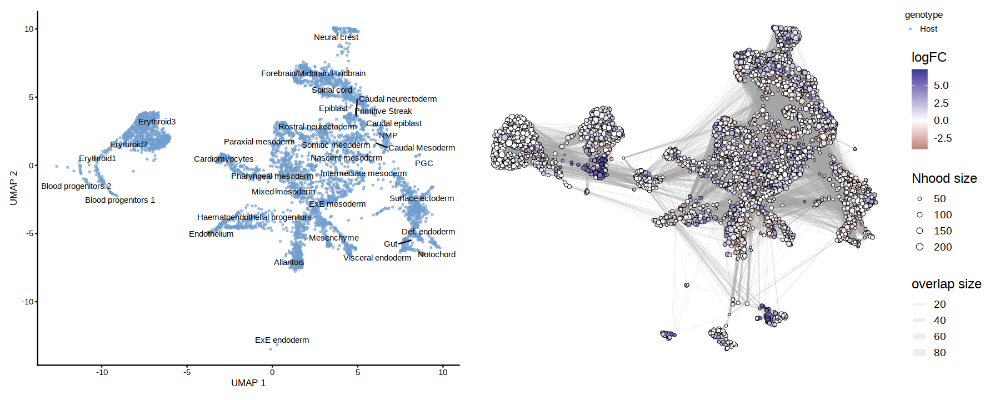

In [593]:
## Plot single-cell UMAP
umap_pl <- plotReducedDim(test, dimred = "UMAP", colour_by="genotype", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.5) +
  guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(embryo_milo, da_results, layout="UMAP",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")